# **Interaction Level Analysis (Non Clipped Scores)**

In [1]:
!pip install pingouin

  Using cached pingouin-0.5.5-py3-none-any.whl.metadata (19 kB)
  Using cached pandas_flavor-0.7.0-py3-none-any.whl.metadata (6.7 kB)
  Using cached tabulate-0.9.0-py3-none-any.whl.metadata (34 kB)
  Using cached xarray-2025.8.0-py3-none-any.whl.metadata (12 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached packaging-25.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached pandas-2.3.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (91 kB)
Using cached pingouin-0.5.5-py3-none-any.whl (204 kB)
Using cached pandas_flavor-0.7.0-py3-none-any.whl (8.4 kB)
Using cached tabulate-0.9.0-py3-none-any.whl (35 kB)
Using cached xarray-2025.8.0-py3-none-any.whl (1.3 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
Using cached pandas-2.3.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (12.4 MB)
Using cached packaging-25.0-py3-none-any.whl (66 kB)


In [2]:
scores = "non_clipped"

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
 
from scipy.stats import ttest_ind
from scipy.stats import pearsonr, norm
import pingouin as pg
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.colors as mcolors

# **Data**

In [4]:
# import EMI data
df_all = pd.read_csv(f"../../data/analysis_data/df_all_{scores}.csv")

# rename
df_all = df_all.rename(columns = {"predictions_prob_disagree" : 'prob_disagree'})
df_all

/tmp/ipykernel_329/3018109309.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df_all = pd.read_csv(f"../../data/analysis_data/df_all_{scores}.csv")


,msg_id_parent,msg_id_child,submission_id,subreddit,exact_time_child,author_child,author_parent,author_submission,finetuned_child_E_norm,finetuned_child_I_norm,...,finetuned_parent_len_norm_z_trans_EMI,finetuned_child_len_norm_z_trans_EMI,finetuned_submission_len_norm_z_trans_EMI,self_parent_len_norm_z_trans_EMI,self_child_len_norm_z_trans_EMI,self_submission_len_norm_z_trans_EMI,predictions_label_ft,predictions_score_ft,prob_disagree,predictions_ft
0,c7ecp8d,c7ecs2n,14m325,Ask_Politics,1355166551.0,karmanaut,Ramblin_Dash,karmanaut,0.053025,0.072843,...,0.514532,-0.116730,0.594431,0.624110,-0.011457,0.172262,0,0.6180,0.38180,no_disagreement
1,c7ecp8d,c7ecxpk,14m325,Ask_Politics,1355167049.0,zoolander951,Ramblin_Dash,karmanaut,0.040605,0.001874,...,0.514532,0.363800,0.594431,0.624110,0.012864,0.172262,0,0.7134,0.28640,no_disagreement
2,c7ecp8d,c7eflag,14m325,Ask_Politics,1355175187.0,zossima,Ramblin_Dash,karmanaut,0.037034,-0.026841,...,0.514532,0.571814,0.594431,0.624110,0.600814,0.172262,0,0.6580,0.34180,no_disagreement
3,c7efx8q,c7ejh1d,14m325,Ask_Politics,1355187644.0,fathermocker,senatorskeletor,karmanaut,0.046751,0.040446,...,0.269966,0.096978,0.594431,0.130100,0.070296,0.172262,1,0.9507,0.95070,disagree
4,c7efx8q,c7f8140,14m325,Ask_Politics,1355286254.0,PKMKII,senatorskeletor,karmanaut,0.029991,-0.043360,...,0.269966,0.644853,0.594431,0.130100,0.612353,0.172262,0,0.8580,0.14180,no_disagreement
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4938799,kfkh5ib,kfmd52k,18uirzt,politics,1970-01-01 00:00:01.703977996,Knightforlife,freddiethebaer,optimalg,0.289315,0.222072,...,1.250681,0.671616,-0.580210,1.062374,0.498045,-0.857240,0,0.9550,0.04495,no_disagreement
4938800,kfklsb6,kforzbx,18uirzt,politics,1970-01-01 00:00:01.704023024,bakerfredricka,4blockhead,optimalg,0.192579,0.210383,...,1.367783,-0.043416,-0.580210,1.165189,-0.381238,-0.857240,0,0.9920,0.00774,no_disagreement
4938801,kfmq5kr,kfp6tzv,18uirzt,politics,1970-01-01 00:00:01.704032059,glassjar1,DoubleTFan,optimalg,0.078374,0.101258,...,-0.197753,-0.140261,-0.580210,0.242695,-0.122822,-0.857240,1,0.8500,0.85000,disagree
4938802,kfp3d4v,kfp8xh8,18uirzt,politics,1970-01-01 00:00:01.704033069,HaulinBoats,4blockhead,optimalg,0.137089,0.224533,...,0.600514,-0.617072,-0.580210,0.207855,-0.789836,-0.857240,0,0.9414,0.05875,no_disagreement


### **Heatmap of Correlation of Submission / Comment / Reply EMI scores**

* Also, confidence intervals and CI's

In [5]:
sub_to_comm = df_all.groupby("msg_id_parent").agg(
    ft_EMI_z_submission_EMI=("finetuned_submission_len_EMI_z_trans", "first"),
    ft_EMI_z_comment_EMI=("finetuned_parent_len_EMI_z_trans", "first"),
    ).reset_index()

sub_to_comm[['ft_EMI_z_submission_EMI', 'ft_EMI_z_comment_EMI']].corr()

pg.corr(x=sub_to_comm['ft_EMI_z_submission_EMI'], y=sub_to_comm['ft_EMI_z_comment_EMI'], method='pearson')

,n,r,CI95%,p-val,BF10,power
pearson,1977544,0.168902,"[0.17, 0.17]",0.0,inf,1.0


In [6]:
com_to_rep = df_all.groupby("msg_id_child").agg(
    ft_EMI_z_submission_EMI=("finetuned_submission_len_EMI_z_trans", "first"),
    ft_EMI_z_comment_EMI=("finetuned_parent_len_EMI_z_trans", "first"),
    ft_EMI_z_reply_EMI=("finetuned_child_len_EMI_z_trans", "first"),
    ).reset_index()

com_to_rep[['ft_EMI_z_submission_EMI', 'ft_EMI_z_comment_EMI', 'ft_EMI_z_reply_EMI']].corr()

pg.corr(x=com_to_rep['ft_EMI_z_comment_EMI'], y=com_to_rep['ft_EMI_z_reply_EMI'], method='pearson')

,n,r,CI95%,p-val,BF10,power
pearson,4938577,0.366815,"[0.37, 0.37]",0.0,inf,1.0


In [7]:
com_to_rep[['ft_EMI_z_submission_EMI', 'ft_EMI_z_comment_EMI', 'ft_EMI_z_reply_EMI']].corr()

,ft_EMI_z_submission_EMI,ft_EMI_z_comment_EMI,ft_EMI_z_reply_EMI
ft_EMI_z_submission_EMI,1.000000,0.170239,0.126381
ft_EMI_z_comment_EMI,0.170239,1.000000,0.366815
ft_EMI_z_reply_EMI,0.126381,0.366815,1.000000


In [8]:
pg.corr(x=com_to_rep['ft_EMI_z_submission_EMI'], y=com_to_rep['ft_EMI_z_reply_EMI'], method='pearson')

,n,r,CI95%,p-val,BF10,power
pearson,4938571,0.126381,"[0.13, 0.13]",0.0,inf,1.0


/tmp/ipykernel_329/1458565229.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])  # leave space on right


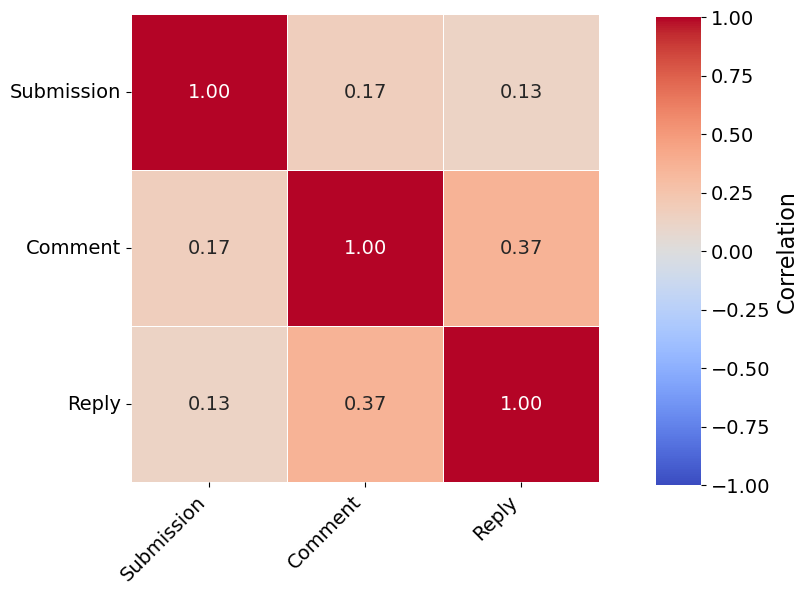

In [9]:
def plot_len_emi_corr_matrix_paper(
    df,
    save_path='Correlation_Text_Level.pdf',
    figsize=(10, 6),
    cbar_position='right'  # Only 'right' supported in this template
):

    # Font settings
    label_fontsize = 16
    tick_fontsize = 14
    title_fontsize = 18

    # Select and rename relevant columns
    corr_cols = [
        'finetuned_submission_len_EMI_z_trans',
        'finetuned_parent_len_EMI_z_trans',
        'finetuned_child_len_EMI_z_trans'
    ]
    col_rename = {
        'finetuned_submission_len_EMI_z_trans': 'Submission',
        'finetuned_parent_len_EMI_z_trans': 'Comment',
        'finetuned_child_len_EMI_z_trans': 'Reply'
    }

    df_corr = df[corr_cols].rename(columns=col_rename)
    corr = df_corr.corr()

    # Global color limits
    global_min = corr.min().min()
    global_max = corr.max().max()
    max_abs = max(abs(global_min), abs(global_max))

    # Set up plot
    fig, ax = plt.subplots(figsize=figsize)

    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        vmin=-max_abs,
        vmax=max_abs,
        ax=ax,
        cbar=False,
        square=True,
        linewidths=0.5,
        annot_kws={"size": tick_fontsize}
    )

    #ax.set_title("Correlation Matrix – Document Level (Length-Adjusted EMI)", fontsize=title_fontsize)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=tick_fontsize)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=tick_fontsize)

    # Custom colorbar placement
    if cbar_position == 'right':
        cbar_ax = fig.add_axes([0.75, 0.19, 0.05, 0.78])  # [left, bottom, width, height]
    else:
        raise NotImplementedError("Only 'right' is currently implemented for colorbar position.")

    norm = mcolors.Normalize(vmin=-max_abs, vmax=max_abs)
    sm = cm.ScalarMappable(cmap="coolwarm", norm=norm)
    sm.set_array([])

    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label("Correlation", fontsize=label_fontsize)
    cbar.ax.tick_params(labelsize=tick_fontsize)
    cbar.outline.set_visible(False)

    # Reserve space for colorbar
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # leave space on right
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()

plot_len_emi_corr_matrix_paper(df_all, figsize=(9, 6), save_path="plots/Correlation_Text_Level_Final.pdf")


In [10]:
# some submissions have no ideology
interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_ideology_{scores}.csv")
interactions_all = interactions_all.merge(df_all[['msg_id_child', 'prob_disagree']], how = "left", right_on = "msg_id_child", left_on = "msg_id_child")
print(len(interactions_all))
print("Nr. of interactions without submission ideology:", len(interactions_all[interactions_all["submission_partisan"].isnull()]))

interactions_all[interactions_all["submission_partisan"].isnull()]["author_submission"].value_counts().sort_values(ascending = False)[:10]


/tmp/ipykernel_329/2567536413.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_ideology_{scores}.csv")


4933855
Nr. of interactions without submission ideology: 3306444


author_submission
politicsmoderatorbot    3289370
politicsmod               12423
automoderator               148
asapientllama               147
direction_dull              128
mmcdonald1442               122
teh_speedster789             84
burakbarannn                 82
ibphysicshl                  52
lastfall                     48
Name: count, dtype: int64

In [11]:
# share of moderators among missing submission-ideology score
(3289370 + 12423 + 148) / len(interactions_all[interactions_all["submission_partisan"].isnull()])

0.9986381139375111

* three moderators out of 722 authors with missing ideology, accounting for 99.9% of the interactions
* $\to$ discard other missing ideologies

In [12]:
# incl mods
interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_ideology_{scores}.csv")
interactions_all = interactions_all.merge(df_all[['msg_id_child', 'prob_disagree']], how = "left", right_on = "msg_id_child", left_on = "msg_id_child")
# add a dummy variable, indicating moderator submissions
interactions_all["Mod_Dummy"] = np.where(interactions_all["author_submission"].isin(["politicsmoderatorbot", "politicsmod", "automoderator"]), 1, 0)
interactions_all["Mod_Dummy"].value_counts()
# drop empty submission ideology 
interactions_all = interactions_all[~(interactions_all['submission_partisan'].isna() & (interactions_all['Mod_Dummy'] == 0))]

# Mods
mod_interactions = interactions_all[interactions_all["author_submission"].isin(["politicsmoderatorbot", "politicsmod", "automoderator"])]

# Human only: full because I have full scores for all three authors
interactions = pd.read_csv(f"../../data/analysis_data/full_interactions_ideology_{scores}.csv")
interactions = interactions.merge(df_all[['msg_id_child', 'prob_disagree']], how = "left", right_on = "msg_id_child", left_on = "msg_id_child")


# rename
interactions = interactions.rename(columns = {"predictions_label_ft" :'disagreement_label'}) 
mod_interactions = mod_interactions.rename(columns = {"predictions_label_ft" :'disagreement_label'}) 
interactions_all = interactions_all.rename(columns = {"predictions_label_ft" :'disagreement_label'}) 


/tmp/ipykernel_329/1211899231.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions_all = pd.read_csv(f"../../data/analysis_data/interactions_ideology_{scores}.csv")
/tmp/ipykernel_329/1211899231.py:14: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactions = pd.read_csv(f"../../data/analysis_data/full_interactions_ideology_{scores}.csv")


***
# **1) EMI and Stance**
***

## **1.1) Submissions EMI and Stance**

In [14]:
interactions.columns
interactions_red = interactions[['msg_id_parent', 'msg_id_child', 'submission_id', 'subreddit', 'author_child', 'author_parent', 'author_submission',
                                'predictions_score_ft', 'predictions_ft', 'prob_disagree',
                                 'parent_partisan', 'child_partisan', 'submission_partisan']]

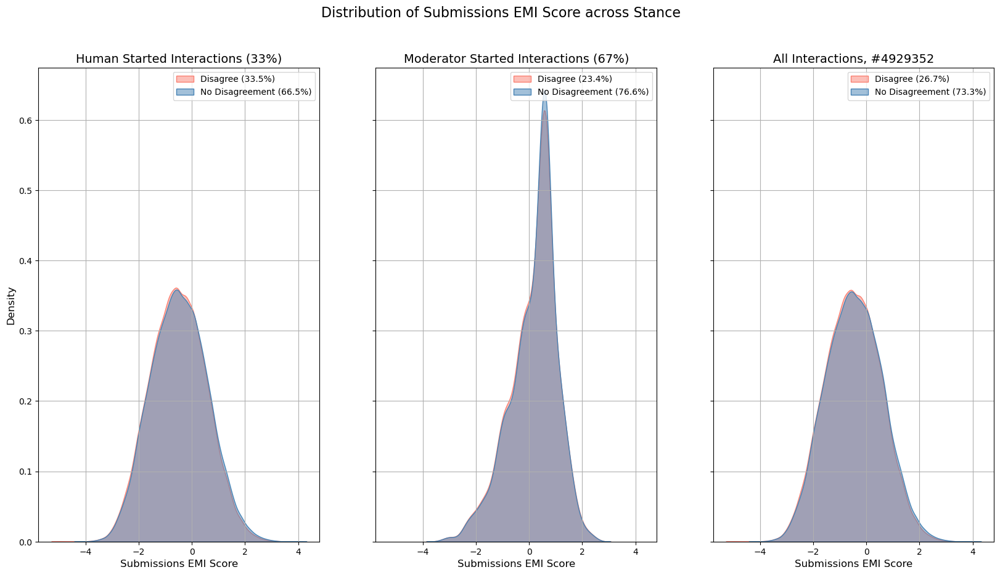

In [15]:
# check: parents EMI score related to interactions stance?
# drop parents by parent_id


fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
fig.suptitle("Distribution of Submissions EMI Score across Stance", fontsize=16)


human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
human_share_no_disagree = len(interactions[interactions['predictions_ft'] == "no_disagreement"]) / len(interactions)

sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[0], label=f'Disagree ({human_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"],  ax = axes[0], label=f'No Disagreement ({human_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[0].set_xlabel("Submissions EMI Score", fontsize = 12)
axes[0].set_ylabel("Density", fontsize = 12)
axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[0].grid(True)

mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
mod_share_no_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"]) / len(mod_interactions)

sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[1], label=f'Disagree ({mod_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"],  ax = axes[1], label=f'No Disagreement ({mod_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[1].set_xlabel("Submissions EMI Score", fontsize = 12)
axes[1].set_ylabel("Density", fontsize = 12)
axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[1].grid(True)

all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
all_share_no_disagree = len(interactions_all[interactions_all['predictions_ft'] == "no_disagreement"]) / len(interactions_all)

sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "disagree"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"], ax = axes[2], label=f'Disagree ({all_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "no_disagreement"].drop_duplicates(subset = "submission_id")[f"finetuned_submission_len_EMI_z_trans"],  ax = axes[2], label=f'No Disagreement ({all_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[2].set_xlabel("Submissions EMI Score", fontsize = 12)
axes[2].set_ylabel("Density", fontsize = 12)
axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize = 14)
axes[2].grid(True)

plt.savefig("plots/Distribution_Submissions_EMI_by_Stance.pdf")


**Interpretation**

* Moderator Submissions are a lot more evidence based, compared to human started discussions
* Across Stance, distribution of EMI scores of submission sis equal
* No tendency of submissions EMI to influence the stance
* $\to$ the moderator submissions will be the same for plotting both density curves.
* $\to$ the same submission appears in disagree and no disagree interactions, and duplicates are dropped
* (correlation of submissions EMI and mean disagreement probability, over all below interactions?)

$\to$ kind of useless, as submissions can feature both, agreement and disacgreement interactions so they add to the distribution of both = no patterns

### **Correlation of EMI and Disagreement Share**

In [16]:
human_submission_disagreement_stats = (
    interactions
    .groupby('submission_id')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_submission_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

human_submission_disagreement_stats

mod_submission_disagreement_stats = (
    mod_interactions
    .groupby('submission_id')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_submission_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

mod_submission_disagreement_stats


all_submission_disagreement_stats = (
    interactions_all
    .groupby('submission_id')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_submission_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

all_submission_disagreement_stats

,submission_id,num_interactions,num_disagree,EMI_score,share_disagree
0,1001a3h,30,2,-0.584611,0.066667
1,1001mh,2,1,0.522836,0.500000
2,1003k02,65,26,-1.131063,0.400000
3,10045jv,7,3,0.422146,0.428571
4,1004fx,2,0,-1.040226,0.000000
...,...,...,...,...,...
100165,zzlqg,2,0,1.127682,0.000000
100166,zzmjp,1,1,-0.848453,1.000000
100167,zznjb,1,0,0.866848,0.000000
100168,zzpai,1,1,0.337770,1.000000


In [20]:
# get correlation and CIs

def get_r_p_CI(df, x_col, y_col):
    # Clean data
    x = df[x_col]
    y = df[y_col]
    
    mask = (~np.isnan(x)) & (~np.isnan(y)) & (~np.isinf(x)) & (~np.isinf(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Compute Pearson r and p
    r, p = pearsonr(x_clean, y_clean)
    
    # Compute 95% CI using Fisher z-transformation
    n = len(x_clean)
    z = np.arctanh(r)  # Fisher transformation
    se = 1 / np.sqrt(n - 3)
    z_crit = norm.ppf(0.975)  # 95% CI
    
    ci_low_z = z - z_crit * se
    ci_high_z = z + z_crit * se
    ci_low = np.tanh(ci_low_z)  
    ci_high = np.tanh(ci_high_z)
    
    # Format (APA style)
    df = n - 2
    p_str = "p < .001" if p < 0.001 else f"p = {p:.3f}"
    
    print(f"r({df}) = {r:.2f}, 95% CI [{ci_low:.2f}, {ci_high:.2f}], {p_str}")

print("Correlation EMI and disagreement share in human started discussions")
get_r_p_CI(human_submission_disagreement_stats, "EMI_score", "share_disagree")

print("Correlation EMI and disagreement share in moderator started discussions")
get_r_p_CI(mod_submission_disagreement_stats, "EMI_score", "share_disagree")

print("Correlation EMI and disagreement share in all discussions")
get_r_p_CI(all_submission_disagreement_stats, "EMI_score", "share_disagree")

Correlation EMI and disagreement share in human started discussions
r(98750) = -0.06, 95% CI [-0.07, -0.06], p < .001
Correlation EMI and disagreement share in moderator started discussions
r(1408) = -0.34, 95% CI [-0.39, -0.30], p < .001
Correlation EMI and disagreement share in all discussions
r(100160) = -0.07, 95% CI [-0.07, -0.06], p < .001


### **Acitivity Differences**

In [21]:
# Check Activity 


activity_human = (
    interactions
    .groupby('submission_id')
    .agg(
        num_comments=('msg_id_parent', 'nunique'),
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)
activity_human

activity_mods = (
    mod_interactions
    .groupby('submission_id')
    .agg(
        num_comments=('msg_id_parent', 'nunique'),
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_mods

activity_all = (
    interactions_all
    .groupby('submission_id')
    .agg(
        num_comments=('msg_id_parent', 'nunique'),
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_all

print("Humans: mean comments per submission", activity_human["num_comments"].mean())
print("Humans: mean replies per submission", activity_human["num_replies"].mean())

print("Mods: mean comments per submission", activity_mods["num_comments"].mean())
print("Mods: mean replies per submission", activity_mods["num_replies"].mean())

print("Overall: mean comments per submission", activity_all["num_comments"].mean())
print("Overall: mean replies per submission", activity_all["num_replies"].mean())



Humans: mean comments per submission 8.124797488861887
Humans: mean replies per submission 16.478442689347915
Mods: mean comments per submission 829.3673758865248
Mods: mean replies per submission 2341.8021276595746
Overall: mean comments per submission 19.684666067684937
Overall: mean replies per submission 49.209863232504745


### **Scatterplots of EMI vs Disagreement**

In [120]:
def plot_emi_vs_disagreement(activity_human, activity_mods, activity_all,
                              human_submission_disagreement_stats,
                              mod_submission_disagreement_stats,
                              all_submission_disagreement_stats,
                              interactions, mod_interactions, interactions_all,
                              filter_mode = "mean", quantile=0.8,
                              save_path="plots/Scatter_Submissions_EMI_Stance.png"):
    """
    Plot EMI score vs. disagreement share for human, mod, and all interactions
    based on activity filters (mean or quantile).
    
    Parameters:
        filter_mode (str): 'mean' or 'quantile'
        quantile (float): quantile threshold if filter_mode='quantile'
    """

    # Filtering logic
    if filter_mode == 'mean':
        active_humans = activity_human[activity_human["num_comments"] >= activity_human["num_comments"].mean()]
        active_mods = activity_mods[activity_mods["num_comments"] >= activity_mods["num_comments"].mean()]
        active_all = activity_all[activity_all["num_comments"] >= activity_all["num_comments"].mean()]
        filter_title = "Submissions with More than Average Comments"
    elif filter_mode == 'quantile':
        active_humans = activity_human[activity_human["num_comments"] >= activity_human["num_comments"].quantile(quantile)]
        active_mods = activity_mods[activity_mods["num_comments"] >= activity_mods["num_comments"].quantile(quantile)]
        active_all = activity_all[activity_all["num_comments"] >= activity_all["num_comments"].quantile(quantile)]
        filter_title = f"Submissions with Top {int(quantile * 100)}% Comment Count"
    elif filter_mode == "None":
        active_humans = activity_human.copy()
        active_mods = activity_mods.copy()
        active_all = activity_all.copy()
        filter_title = f"All Submissions"
    else:
        raise ValueError("filter_mode must be 'mean' or 'quantile'")

    # Filter disagreement data
    active_human_interactions = human_submission_disagreement_stats[
        human_submission_disagreement_stats["submission_id"].isin(active_humans["submission_id"])]
    active_mod_interactions = mod_submission_disagreement_stats[
        mod_submission_disagreement_stats["submission_id"].isin(active_mods["submission_id"])]
    active_all_interactions = all_submission_disagreement_stats[
        all_submission_disagreement_stats["submission_id"].isin(active_all["submission_id"])]

    fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
    #fig.suptitle(f"Relation of Submissions EMI Score and Stance\n{filter_title}", fontsize=16)

    # Shared plotting logic
    datasets = [
        ("Human Started Interactions", interactions, active_human_interactions, axes[0], (len(interactions) / len(interactions_all)) * 100),
        ("Moderator Started Interactions", mod_interactions, active_mod_interactions, axes[1], (len(mod_interactions) / len(interactions_all)) * 100),
        ("All Interactions", interactions_all, active_all_interactions, axes[2], None)
    ]

    for title, base_data, active_data, ax, percent in datasets:
        share_disagree = len(base_data[base_data['predictions_ft'] == "disagree"]) / len(base_data)

        sns.regplot(
            data=active_data,
            x="EMI_score", y="share_disagree", ax=ax,
            label=f'Disagreement ({share_disagree*100:.1f}%)',
            scatter_kws={'alpha': 0.5},
            line_kws={'color': 'red'}
        )
        
        valid_data = active_data[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
        if len(valid_data) >= 2:
            r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
            ax.annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18,
                        ha='left', va='top', bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
        else:
            ax.annotate("r = N/A", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18,
                        ha='left', va='top', bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

        ax.set_xlabel("Submissions EMI Score", fontsize=20)
        ax.set_ylabel("Share of Disagreement", fontsize=20)
        if percent is not None:
            ax.set_title(f"{title} ({percent:.0f}%)", fontsize=20)
        else:
            ax.set_title(f"{title}, #{len(base_data)}", fontsize=20)
        ax.legend(fontsize=18, loc='upper right')  
        ax.grid(True)
        ax.tick_params(axis='both', labelsize=18)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig(save_path, dpi=300)
    plt.show()

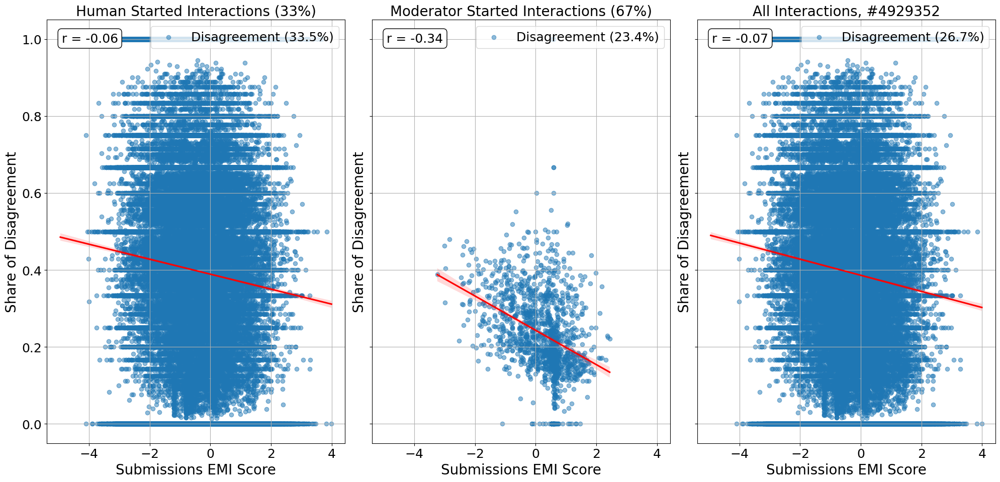

In [121]:
# no threshold

plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "None",
    save_path="plots/Scatter_Submissions_EMI_Stance.png"
)


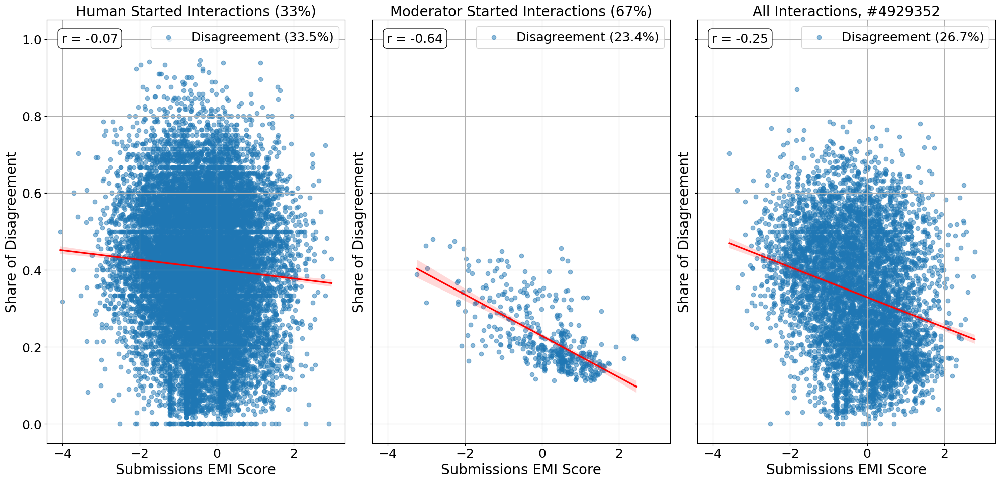

In [122]:
# only above mean activity

plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "mean",
    save_path="plots/Scatter_mean_active_Submissions_EMI_Stance.png"
)


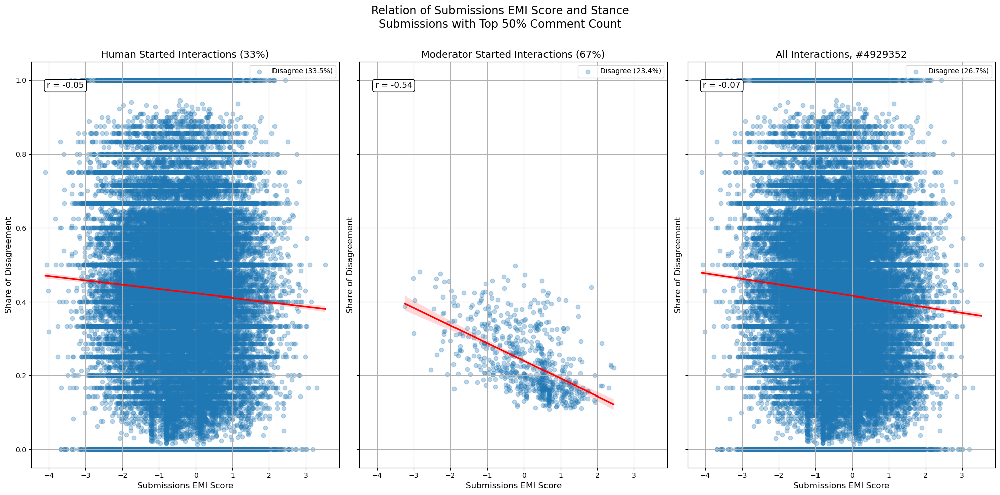

In [71]:
# 50% most active 

plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "quantile", quantile = 0.5,
    save_path= "plots/Scatter_median_active_Submissions_EMI_Stance.png")


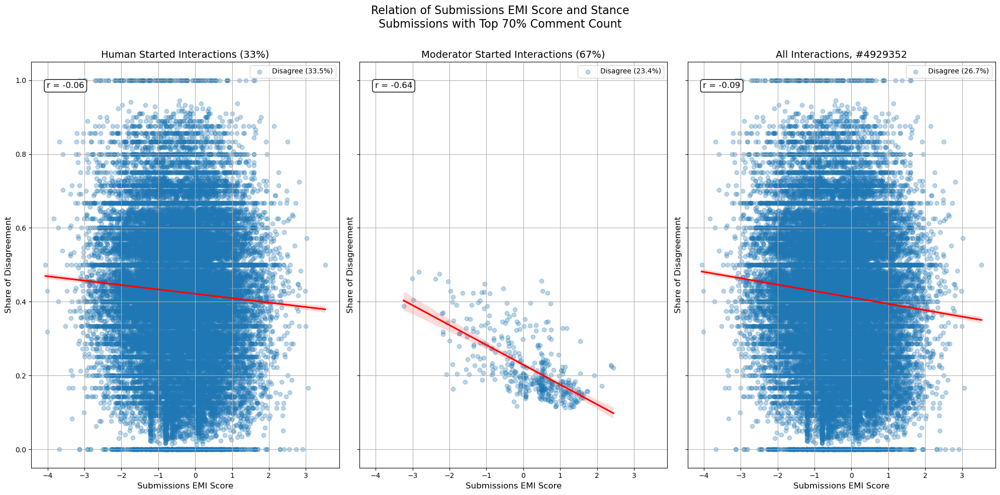

In [72]:
# 70% activity quantile 

plot_emi_vs_disagreement(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all,
    filter_mode = "quantile", quantile = 0.7,
    save_path= "plots/Scatter_7_quantile_active_Submissions_EMI_Stance.png")


### **Correlation Coefficients with CI's for Active Discussions**


In [123]:

active_humans = activity_human[activity_human["num_comments"] >= activity_human["num_comments"].mean()]
active_mods = activity_mods[activity_mods["num_comments"] >= activity_mods["num_comments"].mean()]
active_all = activity_all[activity_all["num_comments"] >= activity_all["num_comments"].mean()]

active_human_interactions = human_submission_disagreement_stats[
    human_submission_disagreement_stats["submission_id"].isin(active_humans["submission_id"])]
active_mod_interactions = mod_submission_disagreement_stats[
    mod_submission_disagreement_stats["submission_id"].isin(active_mods["submission_id"])]
active_all_interactions = all_submission_disagreement_stats[
    all_submission_disagreement_stats["submission_id"].isin(active_all["submission_id"])]


get_r_p_CI(active_human_interactions, "EMI_score", "share_disagree")

get_r_p_CI(active_mod_interactions, "EMI_score", "share_disagree")

get_r_p_CI(active_all_interactions, "EMI_score", "share_disagree")

r(15706) = -0.07, 95% CI [-0.08, -0.05], p < .001
r(457) = -0.64, 95% CI [-0.69, -0.58], p < .001
r(6206) = -0.25, 95% CI [-0.27, -0.22], p < .001


In [35]:
def plot_correlation_by_activity_quantile(
    activity_human, activity_mods, activity_all,
    human_stats, mod_stats, all_stats,
    interactions, mod_interactions, interactions_all,
    quantiles=np.linspace(0, 1, 11)  # 0%, 10%, ..., 100%
):
    results = []

    for q in quantiles:
        # Apply quantile filtering
        def filter_by_quantile(df, q_val):
            if q_val == 0:
                return df.copy()
            return df[df["num_comments"] >= df["num_comments"].quantile(q_val)]

        active_h = filter_by_quantile(activity_human, q)
        active_m = filter_by_quantile(activity_mods, q)
        active_a = filter_by_quantile(activity_all, q)

        h_data = human_stats[human_stats["submission_id"].isin(active_h["submission_id"])]
        m_data = mod_stats[mod_stats["submission_id"].isin(active_m["submission_id"])]
        a_data = all_stats[all_stats["submission_id"].isin(active_a["submission_id"])]

        # Define helper to compute correlation safely
        def get_corr(df):
            valid = df[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
            if len(valid) >= 2:
                return pearsonr(valid["EMI_score"], valid["share_disagree"])[0]
            return np.nan

        results.extend([
            {"Quantile": q, "Correlation": get_corr(h_data), "Group": "Humans"},
            {"Quantile": q, "Correlation": get_corr(m_data), "Group": "Mods"},
            {"Quantile": q, "Correlation": get_corr(a_data), "Group": "All"},
        ])

    # Create DataFrame
    result_df = pd.DataFrame(results)

    color_dict = {"Mods": "salmon",
                  "Humans" : "steelblue",
                  "All" : "green"}
    # Plot
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=result_df, x="Quantile", y="Correlation", hue="Group", palette = color_dict, alpha = 0.7, marker="o")
    plt.title("Correlation Between EMI Score and Disagreement Share by Activity Quantile", fontsize = 16)
    plt.xlabel("Activity Quantile Threshold (Min % of Comment Activity)", fontsize = 12)
    plt.ylabel("Pearson Correlation (r)", fontsize = 12)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("plots/Correlation_by_Activity_Quantile.pdf")
    plt.show()

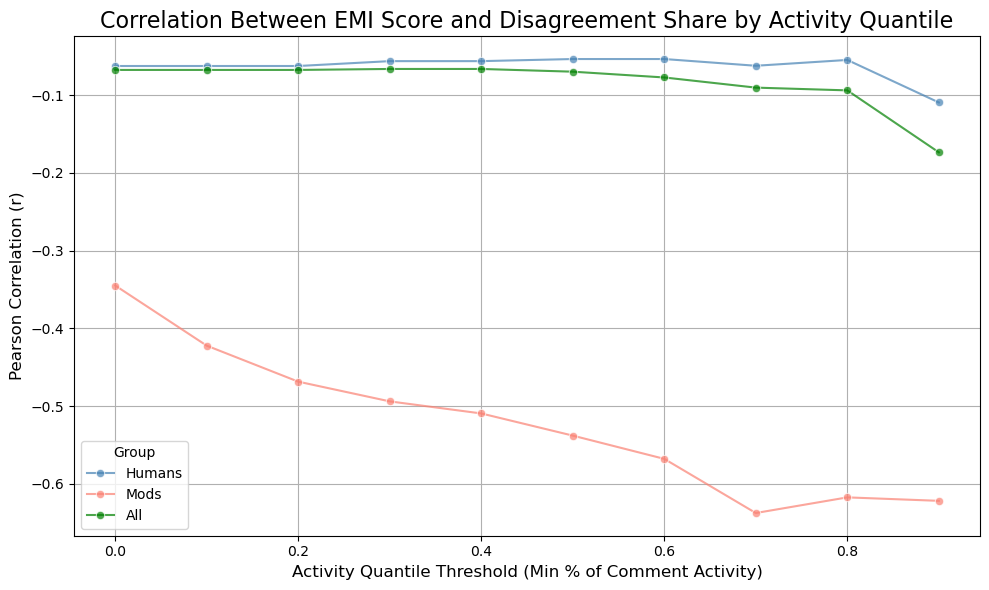

In [36]:
plot_correlation_by_activity_quantile(
    activity_human, activity_mods, activity_all,
    human_submission_disagreement_stats,
    mod_submission_disagreement_stats,
    all_submission_disagreement_stats,
    interactions, mod_interactions, interactions_all
)


**Interpretation**

* more active discussions have a higher negative correlation of submissions EMI with disagreement share
* visible from more than average number of comments on (among human started discussions)

## **1.2) Parent EMI and Stance** 

In [22]:
human_parent_disagreement_stats = (
    interactions
    .groupby('msg_id_parent')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_parent_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

human_parent_disagreement_stats

mod_parent_disagreement_stats = (
    mod_interactions
    .groupby('msg_id_parent')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_parent_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

mod_parent_disagreement_stats


all_parent_disagreement_stats = (
    interactions_all
    .groupby('msg_id_parent')
    .agg(
        num_interactions=('disagreement_label', 'count'),
        num_disagree=('disagreement_label', 'sum'),
        EMI_score=('finetuned_parent_len_EMI_z_trans', 'first')  
    )
    .assign(share_disagree=lambda df: df['num_disagree'] / df['num_interactions'])
    .reset_index()
)

all_parent_disagreement_stats

,msg_id_parent,num_interactions,num_disagree,EMI_score,share_disagree
0,c0ae9r5,1,0,-0.893057,0.000000
1,c0aecro,1,1,-1.388933,1.000000
2,c0aedc3,1,1,-2.224295,1.000000
3,c0aeds9,3,2,-0.884158,0.666667
4,c0aeh4c,1,0,-0.386597,0.000000
...,...,...,...,...,...
1971808,kfpsken,1,0,-1.450048,0.000000
1971809,kfpv99m,1,1,1.278401,1.000000
1971810,kfpzmgq,1,0,-0.893079,0.000000
1971811,kfqdbma,2,0,0.694854,0.000000


### **Correlation Coefficients**

In [125]:
get_r_p_CI(human_parent_disagreement_stats, "EMI_score", "share_disagree")

get_r_p_CI(mod_parent_disagreement_stats, "EMI_score", "share_disagree")

get_r_p_CI(all_parent_disagreement_stats, "EMI_score", "share_disagree")

r(802392) = -0.04, 95% CI [-0.04, -0.04], p < .001
r(1169390) = -0.07, 95% CI [-0.07, -0.07], p < .001
r(1971784) = -0.06, 95% CI [-0.06, -0.06], p < .001


### **Activity Differences?**

In [23]:
# define a map of parent_id to activity 

activity_human = (
    interactions
    .groupby('msg_id_parent')
    .agg(
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)
activity_human

activity_mods = (
    mod_interactions
    .groupby('msg_id_parent')
    .agg(
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_mods

activity_all = (
    interactions_all
    .groupby('msg_id_parent')
    .agg(
        num_replies=('msg_id_child', 'nunique')
    )
    .reset_index()
)

activity_all


print("Humans: mean replies per comment", activity_human["num_replies"].mean())

print("Mods: mean replies per comment", activity_mods["num_replies"].mean())

print("Overall: mean replies per comment", activity_all["num_replies"].mean())


datasets = [
    (activity_human, "Humans"),
    (activity_mods, "Mods"),
    (activity_all, "All")
]

# barely different, makes no sense to add an activity threshols on replies

Humans: mean replies per comment 2.0281665742362023
Mods: mean replies per comment 2.8236004884522767
Overall: mean replies per comment 2.499908459879309


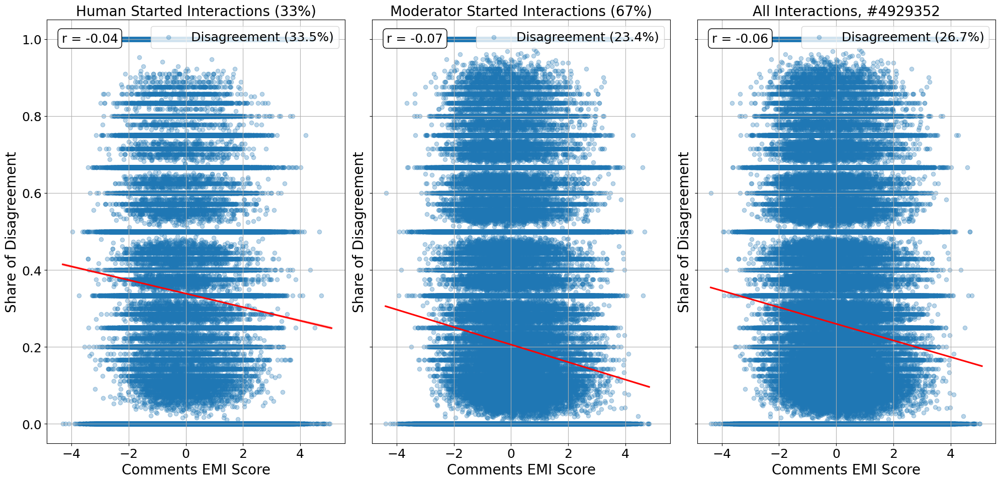

In [133]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Parents EMI Score and Stance", fontsize=16)

# --- Human Started Interactions ---
human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
sns.regplot(
    data=human_parent_disagreement_stats,
    x="EMI_score", y="share_disagree", ax=axes[0],
    label=f'Disagreement ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = human_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_xlabel("Comments EMI Score", fontsize=20)
axes[0].set_ylabel("Share of Disagreement", fontsize=20)
axes[0].legend(fontsize = 18, loc='upper right')
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)

# --- Moderator Started Interactions ---
mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
sns.regplot(
    data=mod_parent_disagreement_stats,
    x="EMI_score", y="share_disagree", ax=axes[1],
    label=f'Disagreement ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = mod_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_xlabel("Comments EMI Score", fontsize=20)
axes[1].set_ylabel("Share of Disagreement", fontsize=20)
axes[1].legend(fontsize = 18, loc='upper right')
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- All Interactions ---
all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
sns.regplot(
    data=all_parent_disagreement_stats,
    x="EMI_score", y="share_disagree", ax=axes[2],
    label=f'Disagreement ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = all_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["EMI_score"], valid_data["share_disagree"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_xlabel("Comments EMI Score", fontsize=20)
axes[2].set_ylabel("Share of Disagreement", fontsize=20)
axes[2].legend(fontsize = 18, loc='upper right')
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_Parent_EMI_Stance.png", dpi = 300, bbox_inches='tight')

#plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

## **1.3) Interactions EMI and Stance**

* Interactions EMI $\to$ mean of comment and reply EMI score

In [24]:
interactions["mean_EMI_interaction_ft_EMI_z"] = (
    interactions["finetuned_parent_len_EMI_z_trans"] +
    interactions["finetuned_child_len_EMI_z_trans"]
) / 2
interactions["mean_EMI_interaction_ft_z_EMI"] = (
    interactions["finetuned_parent_len_norm_z_trans_EMI"] +
    interactions["finetuned_child_len_norm_z_trans_EMI"]
) / 2
interactions["mean_EMI_interaction_sb_EMI_z"] = (
    interactions["self_parent_len_EMI_z_trans"] +
    interactions["self_child_len_EMI_z_trans"]
) / 2
interactions["mean_EMI_interaction_sb_z_EMI"] = (
    interactions["self_parent_len_norm_z_trans_EMI"] +
    interactions["self_child_len_norm_z_trans_EMI"]
) / 2


# mod interactions
mod_interactions["mean_EMI_interaction_ft_EMI_z"] = (
    mod_interactions["finetuned_parent_len_EMI_z_trans"] +
    mod_interactions["finetuned_child_len_EMI_z_trans"]
) / 2
mod_interactions["mean_EMI_interaction_ft_z_EMI"] = (
    mod_interactions["finetuned_parent_len_norm_z_trans_EMI"] +
    mod_interactions["finetuned_child_len_norm_z_trans_EMI"]
) / 2
mod_interactions["mean_EMI_interaction_sb_EMI_z"] = (
    mod_interactions["self_parent_len_EMI_z_trans"] +
    mod_interactions["self_child_len_EMI_z_trans"]
) / 2
mod_interactions["mean_EMI_interaction_sb_z_EMI"] = (
    mod_interactions["self_parent_len_norm_z_trans_EMI"] +
    mod_interactions["self_child_len_norm_z_trans_EMI"]
) / 2



# all interactions
interactions_all["mean_EMI_interaction_ft_EMI_z"] = (
    interactions_all["finetuned_parent_len_EMI_z_trans"] +
    interactions_all["finetuned_child_len_EMI_z_trans"]
) / 2
interactions_all["mean_EMI_interaction_ft_z_EMI"] = (
    interactions_all["finetuned_parent_len_norm_z_trans_EMI"] +
    interactions_all["finetuned_child_len_norm_z_trans_EMI"]
) / 2
interactions_all["mean_EMI_interaction_sb_EMI_z"] = (
    interactions_all["self_parent_len_EMI_z_trans"] +
    interactions_all["self_child_len_EMI_z_trans"]
) / 2
interactions_all["mean_EMI_interaction_sb_z_EMI"] = (
    interactions_all["self_parent_len_norm_z_trans_EMI"] +
    interactions_all["self_child_len_norm_z_trans_EMI"]
) / 2

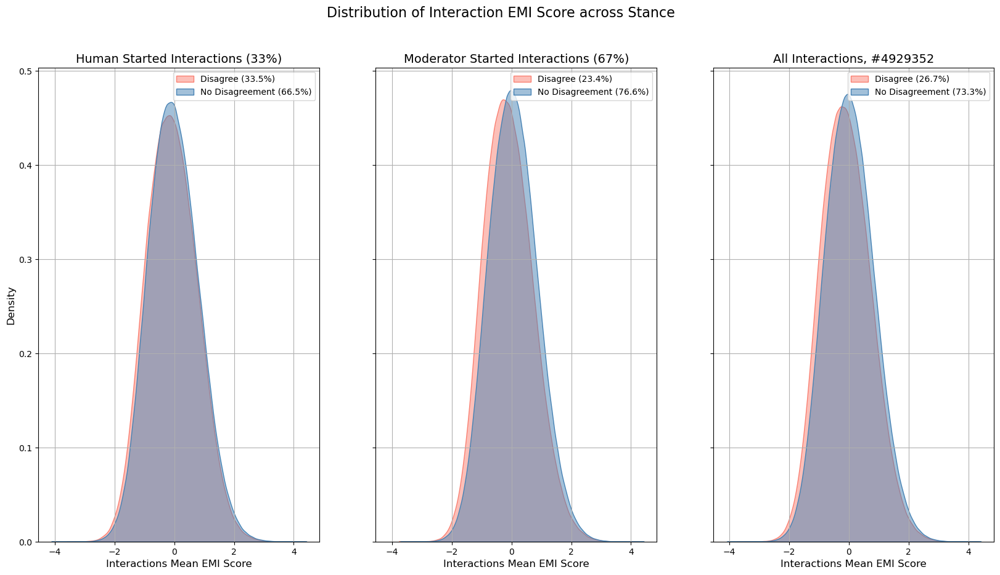

In [40]:
# no drop of rows, because each interaction is unique, the combo of parent & child

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
fig.suptitle("Distribution of Interaction EMI Score across Stance", fontsize=16)


human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
human_share_no_disagree = len(interactions[interactions['predictions_ft'] == "no_disagreement"]) / len(interactions)

sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[0], label=f'Disagree ({human_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"],  ax = axes[0], label=f'No Disagreement ({human_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[0].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
axes[0].set_ylabel("Density", fontsize = 12)
axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[0].grid(True)

mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
mod_share_no_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"]) / len(mod_interactions)

sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[1], label=f'Disagree ({mod_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"],  ax = axes[1], label=f'No Disagreement ({mod_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[1].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
axes[1].set_ylabel("Density", fontsize = 12)
axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[1].grid(True)

all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
all_share_no_disagree = len(interactions_all[interactions_all['predictions_ft'] == "no_disagreement"]) / len(interactions_all)

sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], ax = axes[2], label=f'Disagree ({all_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"],  ax = axes[2], label=f'No Disagreement ({all_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[2].set_xlabel("Interactions Mean EMI Score", fontsize = 12)
axes[2].set_ylabel("Density", fontsize = 12)
axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize = 14)
axes[2].grid(True)

plt.savefig("plots/Distribution_Interaction_EMI_by_Stance.pdf")

**Interpretations**

* Interactions evolving below Moderator Submissions:
    * no_disagreement are more E based
 
* For human started discussions:
    * all interactions (disagree and no), same EMI distribution 

In [25]:
# interactions EMI correlation with disagree probability
get_r_p_CI(interactions, "mean_EMI_interaction_ft_EMI_z", "prob_disagree")

get_r_p_CI(mod_interactions, "mean_EMI_interaction_ft_EMI_z", "prob_disagree")

get_r_p_CI(interactions_all, "mean_EMI_interaction_ft_EMI_z", "prob_disagree")


r(1627346) = -0.04, 95% CI [-0.04, -0.04], p < .001
r(3301775) = -0.09, 95% CI [-0.09, -0.09], p < .001
r(4929123) = -0.08, 95% CI [-0.08, -0.08], p < .001


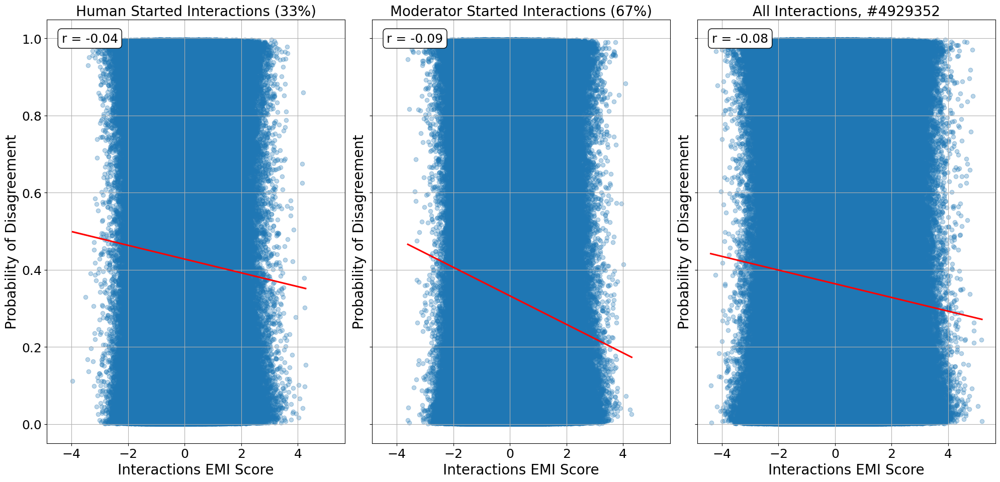

In [26]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Interactions EMI Score and Stance", fontsize=16)

# --- Human Started Interactions ---
human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
sns.regplot(
    data=interactions,
    x="mean_EMI_interaction_ft_EMI_z", y="prob_disagree", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions[["mean_EMI_interaction_ft_EMI_z", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["mean_EMI_interaction_ft_EMI_z"], valid_data["prob_disagree"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_xlabel("Interactions EMI Score", fontsize=20)
axes[0].set_ylabel("Probability of Disagreement", fontsize=20)
#axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)

# --- Moderator Started Interactions ---
mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
sns.regplot(
    data=mod_interactions,
    x="mean_EMI_interaction_ft_EMI_z", y="prob_disagree", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = mod_interactions[["mean_EMI_interaction_ft_EMI_z", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["mean_EMI_interaction_ft_EMI_z"], valid_data["prob_disagree"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_xlabel("Interactions EMI Score", fontsize=20)
axes[1].set_ylabel("Probability of Disagreement", fontsize=20)
#axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- All Interactions ---
all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
sns.regplot(
    data=interactions_all,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions_all[["mean_EMI_interaction_ft_EMI_z", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["mean_EMI_interaction_ft_EMI_z"], valid_data["prob_disagree"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_xlabel("Interactions EMI Score", fontsize=20)
axes[2].set_ylabel("Probability of Disagreement", fontsize=20)
#axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.savefig("plots/Scatter_Interactions_EMI_Stance.png", dpi = 300)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

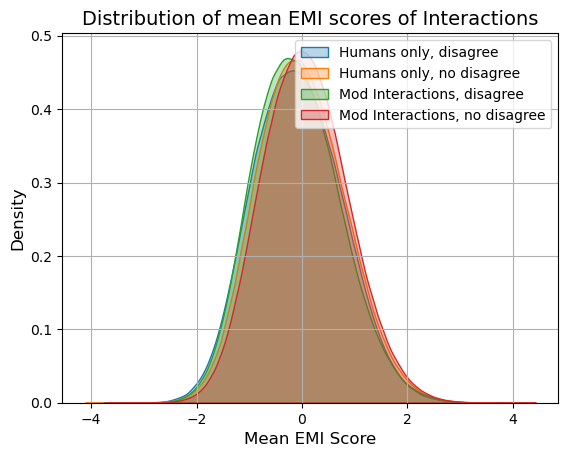

In [27]:
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], label='Humans only, disagree', fill=True, alpha=0.3)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"], label='Humans only, no disagree',  fill=True, alpha=0.3)


sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"][f"mean_EMI_interaction_ft_EMI_z"], label='Mod Interactions, disagree',  fill=True, alpha=0.3)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"][f"mean_EMI_interaction_ft_EMI_z"], label='Mod Interactions, no disagree',  fill=True, alpha=0.3)


plt.xlabel("Mean EMI Score", fontsize = 12)
plt.ylabel("Density", fontsize = 12)
plt.legend()
plt.title(f"Distribution of mean EMI scores of Interactions", fontsize = 14)
plt.grid(True)

## **1.4) Replies EMI and Stance**

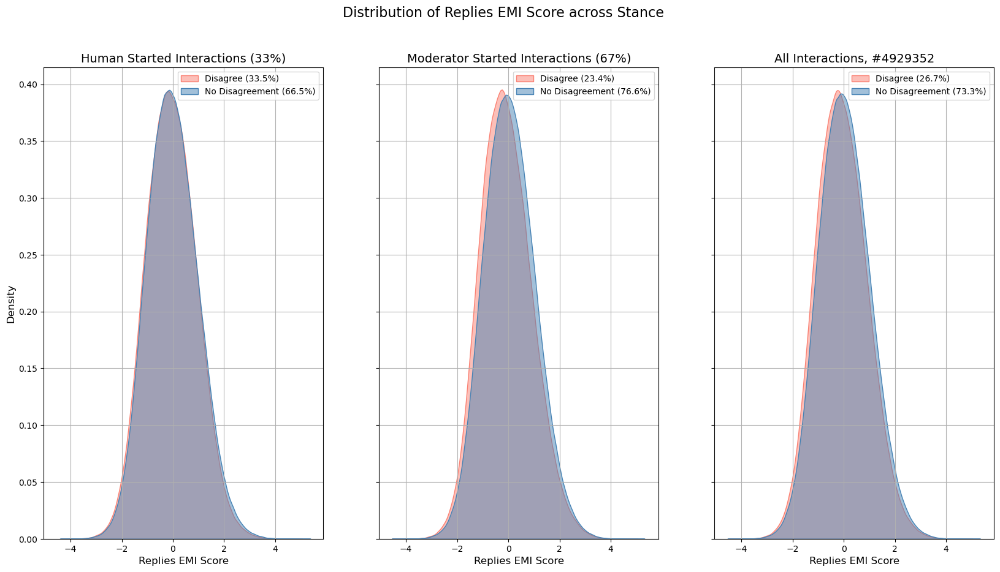

In [43]:
# check: replies EMI score related to interactions stance?
# drop based on child (should be unqiue anyways)

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
fig.suptitle("Distribution of Replies EMI Score across Stance", fontsize=16)


human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
human_share_no_disagree = len(interactions[interactions['predictions_ft'] == "no_disagreement"]) / len(interactions)

sns.kdeplot(data=interactions[interactions['predictions_ft'] == "disagree"][f"finetuned_child_len_EMI_z_trans"], ax = axes[0], label=f'Disagree ({human_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions[interactions['predictions_ft'] == "no_disagreement"][f"finetuned_child_len_EMI_z_trans"],  ax = axes[0], label=f'No Disagreement ({human_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[0].set_xlabel("Replies EMI Score", fontsize = 12)
axes[0].set_ylabel("Density", fontsize = 12)
axes[0].legend()
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[0].grid(True)

mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
mod_share_no_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"]) / len(mod_interactions)

sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "disagree"][f"finetuned_child_len_EMI_z_trans"], ax = axes[1], label=f'Disagree ({mod_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=mod_interactions[mod_interactions['predictions_ft'] == "no_disagreement"][f"finetuned_child_len_EMI_z_trans"],  ax = axes[1], label=f'No Disagreement ({mod_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[1].set_xlabel("Replies EMI Score", fontsize = 12)
axes[1].set_ylabel("Density", fontsize = 12)
axes[1].legend()
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) *100:.0f}%)", fontsize = 14)
axes[1].grid(True)

all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
all_share_no_disagree = len(interactions_all[interactions_all['predictions_ft'] == "no_disagreement"]) / len(interactions_all)

sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "disagree"][f"finetuned_child_len_EMI_z_trans"], ax = axes[2], label=f'Disagree ({all_share_disagree*100:.1f}%)', color='salmon', fill=True, alpha=0.5)
sns.kdeplot(data=interactions_all[interactions_all['predictions_ft'] == "no_disagreement"][f"finetuned_child_len_EMI_z_trans"],  ax = axes[2], label=f'No Disagreement ({all_share_no_disagree*100:.1f}%)', color='steelblue', fill=True, alpha=0.5)
axes[2].set_xlabel("Replies EMI Score", fontsize = 12)
axes[2].set_ylabel("Density", fontsize = 12)
axes[2].legend()
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize = 14)
axes[2].grid(True)

plt.savefig("plots/Distribution_Reply_EMI_by_Stance.pdf")


**Interpretation**

* Moderator submissions are more evidence based
* Evidence based submissions lead to lower share of disagreement
* Same holds for evidence based parents
* Among Interactions mean_EMI we also see: no_disagreement distribution shifted to the right
    * driven by parent: higer EMI less disagree
    * checking childrens distribution: same pattern
 
$\to$ across all text types, E based speaking reduced the chances for disagreement

$\to$ stronger for moderators, than humans

* robust to fine-tuned vs. self-build model (see below)

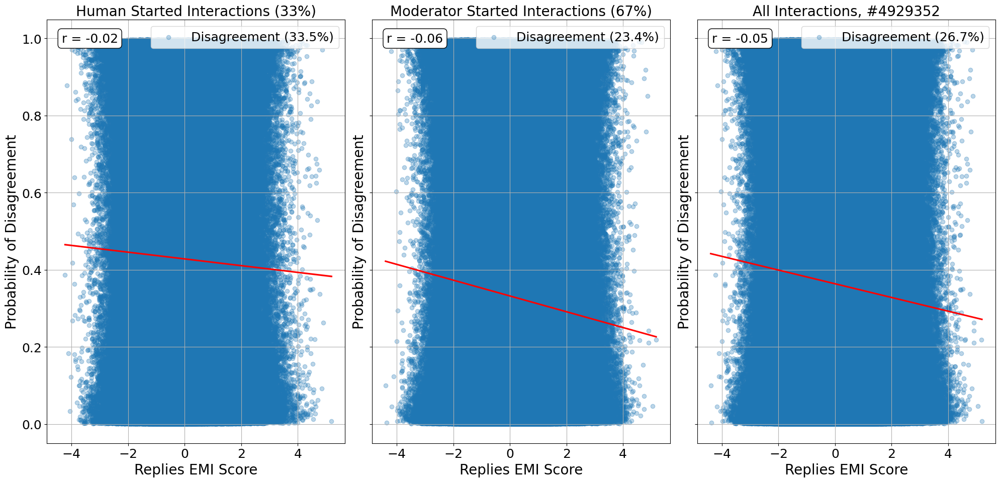

In [134]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Replies EMI Score and Stance", fontsize=16)

# --- Human Started Interactions ---
human_share_disagree = len(interactions[interactions['predictions_ft'] == "disagree"]) / len(interactions)
sns.regplot(
    data=interactions,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[0],
    label=f'Disagreement ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions[["finetuned_child_len_EMI_z_trans", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["finetuned_child_len_EMI_z_trans"], valid_data["prob_disagree"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_xlabel("Replies EMI Score", fontsize=20)
axes[0].set_ylabel("Probability of Disagreement", fontsize=20)
axes[0].legend(fontsize = 18, loc='upper right')
axes[0].set_title(f"Human Started Interactions ({(len(interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


# --- Moderator Started Interactions ---
mod_share_disagree = len(mod_interactions[mod_interactions['predictions_ft'] == "disagree"]) / len(mod_interactions)
sns.regplot(
    data=mod_interactions,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[1],
    label=f'Disagreement ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = mod_interactions[["finetuned_child_len_EMI_z_trans", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["finetuned_child_len_EMI_z_trans"], valid_data["prob_disagree"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_xlabel("Replies EMI Score", fontsize=20)
axes[1].set_ylabel("Probability of Disagreement", fontsize=20)
axes[1].legend(fontsize = 18, loc='upper right')
axes[1].set_title(f"Moderator Started Interactions ({(len(mod_interactions) / len(interactions_all)) * 100:.0f}%)", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- All Interactions ---
all_share_disagree = len(interactions_all[interactions_all['predictions_ft'] == "disagree"]) / len(interactions_all)
sns.regplot(
    data=interactions_all,
    x="finetuned_child_len_EMI_z_trans", y="prob_disagree", ax=axes[2],
    label=f'Disagreement ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = interactions_all[["finetuned_child_len_EMI_z_trans", "prob_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["finetuned_child_len_EMI_z_trans"], valid_data["prob_disagree"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_xlabel("Replies EMI Score", fontsize=20)
axes[2].set_ylabel("Probability of Disagreement", fontsize=20)
axes[2].legend(fontsize = 18, loc='upper right')
axes[2].set_title(f"All Interactions, #{len(interactions_all)}", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_Child_EMI_Stance.png", dpi = 300, bbox_inches='tight')

plt.show()

In [28]:
# Correlation of childs EMI with disagree_probabilits: does the childs speaking type predict the label?

get_r_p_CI(interactions, "finetuned_child_len_EMI_z_trans", "prob_disagree")

get_r_p_CI(mod_interactions, "finetuned_child_len_EMI_z_trans", "prob_disagree")

get_r_p_CI(interactions_all, "finetuned_child_len_EMI_z_trans", "prob_disagree")


r(1627363) = -0.02, 95% CI [-0.03, -0.02], p < .001
r(3301799) = -0.06, 95% CI [-0.06, -0.06], p < .001
r(4929164) = -0.05, 95% CI [-0.05, -0.05], p < .001


## **1.5) Comparison of EMI Scores across embedding models**

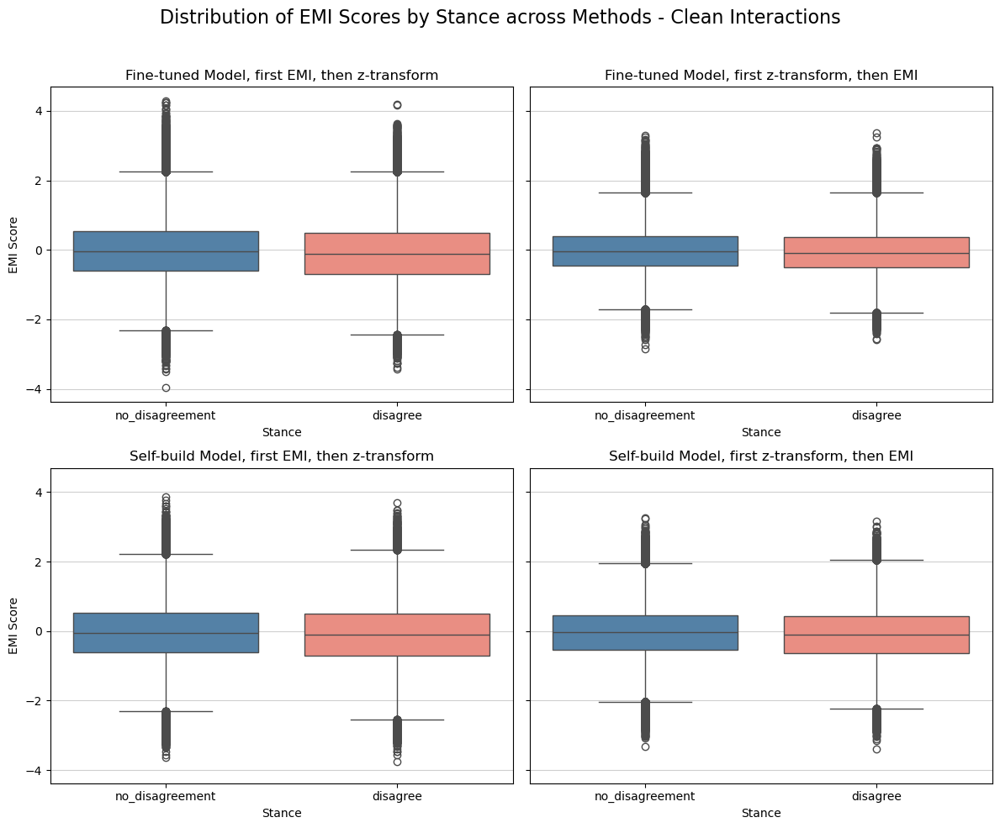

In [82]:
# human only 

color_dict = {"disagree" : "salmon", "no_disagreement" : "steelblue"}
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharey=True)
axes = axes.flatten()


title_dict = {"mean_EMI_interaction_ft_EMI_z" : "Fine-tuned Model, first EMI, then z-transform",
               "mean_EMI_interaction_ft_z_EMI" : "Fine-tuned Model, first z-transform, then EMI", 
               "mean_EMI_interaction_sb_EMI_z" : "Self-build Model, first EMI, then z-transform", 
               "mean_EMI_interaction_sb_z_EMI" : "Self-build Model, first z-transform, then EMI"}


methods = ["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]

# Plot for each category
for i, method in enumerate(methods):
    sns.boxplot(
        x='predictions_ft',
        y=method,
        data=interactions[interactions["predictions_ft"] != "ambiguous"],
        hue = 'predictions_ft',
        palette=color_dict,
        ax=axes[i]
    )
    axes[i].set_title(f'{title_dict[method]}')
    axes[i].set_xlabel('Stance')
    axes[i].set_ylabel('EMI Score')
    axes[i].grid(True, axis='y', alpha=0.6)

plt.suptitle('Distribution of EMI Scores by Stance across Methods - Clean Interactions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.savefig("plots/EMI_Box_by_Stance.pdf")
plt.show()

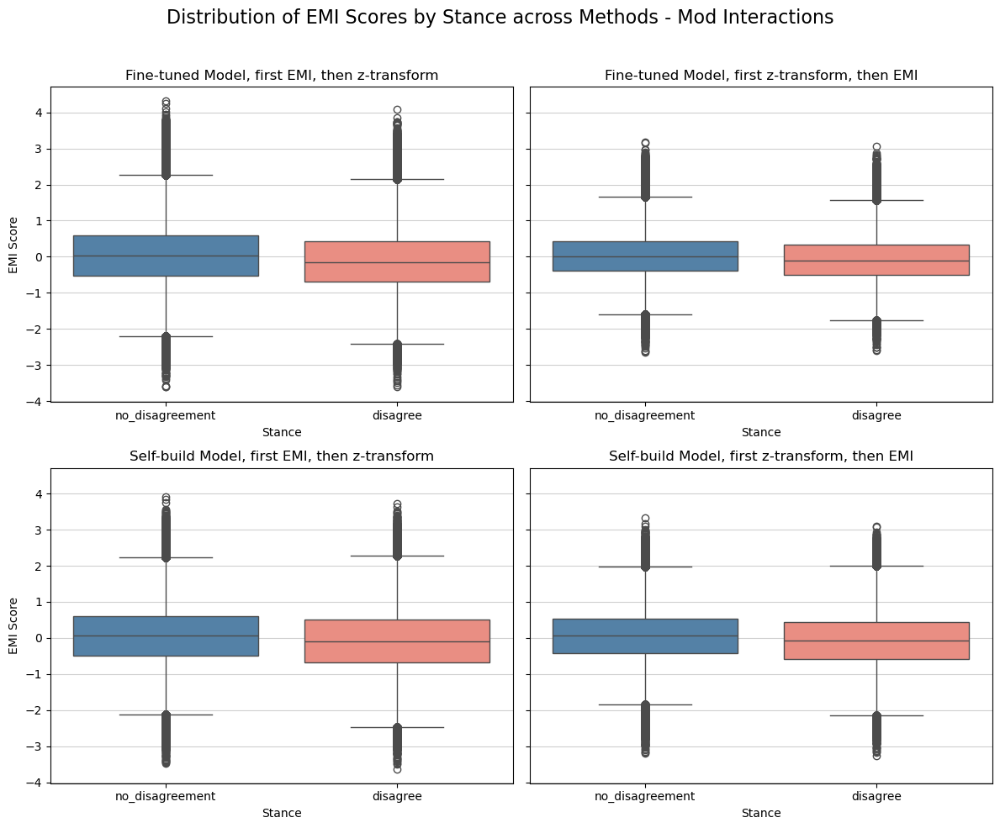

In [83]:
# Mods only

color_dict = {"disagree" : "salmon", "no_disagreement" : "steelblue"}
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharey=True)
axes = axes.flatten()


title_dict = {"mean_EMI_interaction_ft_EMI_z" : "Fine-tuned Model, first EMI, then z-transform",
               "mean_EMI_interaction_ft_z_EMI" : "Fine-tuned Model, first z-transform, then EMI", 
               "mean_EMI_interaction_sb_EMI_z" : "Self-build Model, first EMI, then z-transform", 
               "mean_EMI_interaction_sb_z_EMI" : "Self-build Model, first z-transform, then EMI"}


methods = ["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]

# Plot for each category
for i, method in enumerate(methods):
    sns.boxplot(
        x='predictions_ft',
        y=method,
        data=mod_interactions[mod_interactions["predictions_ft"] != "ambiguous"],
        hue = 'predictions_ft',
        palette=color_dict,
        ax=axes[i]
    )
    axes[i].set_title(f'{title_dict[method]}')
    axes[i].set_xlabel('Stance')
    axes[i].set_ylabel('EMI Score')
    axes[i].grid(True, axis='y', alpha=0.6)

plt.suptitle('Distribution of EMI Scores by Stance across Methods - Mod Interactions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
#plt.savefig("plots/EMI_Box_by_Stance.pdf")
plt.show()

## **1.6) Mean Difference in EMI by Stance Tests** 

In [29]:
# Human
interactions.groupby("predictions_ft")[["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
                                        "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]].mean().reset_index()


,predictions_ft,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,disagree,-0.086959,-0.060329,-0.105023,-0.100709
1,no_disagreement,-0.019366,-0.015829,-0.042399,-0.040532


In [86]:
# Mod
mod_interactions.groupby("predictions_ft")[["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
                                        "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]].mean().reset_index()


,predictions_ft,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,disagree,-0.105165,-0.070616,-0.079630,-0.072914
1,no_disagreement,0.056925,0.039592,0.062855,0.059455


In [87]:
# All
interactions_all.groupby("predictions_ft")[["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
                                        "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]].mean().reset_index()


,predictions_ft,mean_EMI_interaction_ft_EMI_z,mean_EMI_interaction_ft_z_EMI,mean_EMI_interaction_sb_EMI_z,mean_EMI_interaction_sb_z_EMI
0,disagree,-0.097642,-0.066366,-0.090123,-0.084399
1,no_disagreement,0.034051,0.022975,0.031297,0.029477


In [30]:

def make_t_test(df, EMI_method):
    group1 = df[df["predictions_ft"] == "disagree"][EMI_method].dropna()
    group2 = df[df["predictions_ft"] == "no_disagreement"][EMI_method].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    return f"{EMI_method}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"


In [31]:
# significant differende in mean EMI between disagree and no disagreement

methods = ["mean_EMI_interaction_ft_EMI_z", "mean_EMI_interaction_ft_z_EMI", 
           "mean_EMI_interaction_sb_EMI_z", "mean_EMI_interaction_sb_z_EMI"]



print("Clean Interactions:")
print("--------------------")
for method in methods:
    print(make_t_test(interactions, method))
print("")

print("Mod Interactions:")
print("--------------------")
for method in methods:
    print(make_t_test(mod_interactions, method))
print("")


print("All Interactions:")
print("--------------------")
for method in methods:
    print(make_t_test(interactions_all, method))


Clean Interactions:
--------------------
mean_EMI_interaction_ft_EMI_z: t = -48.592, p = 0.0000 (***)
mean_EMI_interaction_ft_z_EMI: t = -43.005, p = 0.0000 (***)
mean_EMI_interaction_sb_EMI_z: t = -43.985, p = 0.0000 (***)
mean_EMI_interaction_sb_z_EMI: t = -48.331, p = 0.0000 (***)

Mod Interactions:
--------------------
mean_EMI_interaction_ft_EMI_z: t = -151.454, p = 0.0000 (***)
mean_EMI_interaction_ft_z_EMI: t = -140.509, p = 0.0000 (***)
mean_EMI_interaction_sb_EMI_z: t = -128.735, p = 0.0000 (***)
mean_EMI_interaction_sb_z_EMI: t = -137.500, p = 0.0000 (***)

All Interactions:
--------------------
mean_EMI_interaction_ft_EMI_z: t = -156.071, p = 0.0000 (***)
mean_EMI_interaction_ft_z_EMI: t = -143.627, p = 0.0000 (***)
mean_EMI_interaction_sb_EMI_z: t = -139.752, p = 0.0000 (***)
mean_EMI_interaction_sb_z_EMI: t = -150.306, p = 0.0000 (***)


In [32]:
# significant mean EMI difference in disagree between humand and mod?

def make_t_test(df_1, df_2, label = "disagree", EMI_method = "mean_EMI_interaction_ft_EMI_z"):
    
    group1 = df_1[df_1["predictions_ft"] == label][EMI_method].dropna()
    group2 = df_2[df_2["predictions_ft"] == label][EMI_method].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    print(group1.mean())
    print(group2.mean())

    return f"{label}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"


print("Disagree, siginficance test for different mean EMI between Humans and Mods")
print(make_t_test(interactions, mod_interactions, label = "disagree"))

print("----------")
print("No disagreement, siginficance test for different mean EMI between Humans and Mods")
print(make_t_test(interactions, mod_interactions, label = "no_disagreement"))

Disagree, siginficance test for different mean EMI between Humans and Mods
-0.08695857097239408
-0.10516507255469716
disagree: t = 12.336, p = 0.0000 (***)
----------
No disagreement, siginficance test for different mean EMI between Humans and Mods
-0.019366140486237735
0.0569252273892329
no_disagreement: t = -80.329, p = 0.0000 (***)


In [33]:
# For submissions and parents EMI, we need to get disagreement share (majority stance), 
# because they are not unique

# make column majorty disagree, majorty no disagree, equal and add mean EMI Score

def make_majority(df):
    conditions = [
        df['share_disagree'] > 0.5,
        df['share_disagree'] < 0.5,
        df['share_disagree'] == 0.5
    ]
    
    choices = [
        'majority_disagree',
        'majority_no_disagreement',
        'indifferent'
    ]
    
    # Apply the conditions
    df['disagreement_status'] = np.select(conditions, choices)
    return df


all_submission_disagreement_stats = make_majority(all_submission_disagreement_stats)
all_parent_disagreement_stats = make_majority(all_parent_disagreement_stats)


In [34]:

def make_t_test(df, EMI_method = "mean_EMI_interaction_ft_EMI_z"):
    group1 = df[df["disagreement_status"] == "majority_disagree"]["EMI_score"].dropna()
    group2 = df[df["disagreement_status"] == "majority_no_disagreement"]["EMI_score"].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    return f"{EMI_method}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"



print("Submissions:")
print("--------------------")
print(all_submission_disagreement_stats.groupby("disagreement_status")[["EMI_score"]].mean().reset_index())
print(make_t_test(all_submission_disagreement_stats, EMI_method = "mean_EMI_interaction_ft_EMI_z"))


print("Parents:")
print("--------------------")
print(all_parent_disagreement_stats.groupby("disagreement_status")[["EMI_score"]].mean().reset_index())
print(make_t_test(all_parent_disagreement_stats, EMI_method = "mean_EMI_interaction_ft_EMI_z"))



# differences are not huge, but significant

Submissions:
--------------------
        disagreement_status  EMI_score
0               indifferent  -0.566863
1         majority_disagree  -0.574258
2  majority_no_disagreement  -0.429057
mean_EMI_interaction_ft_EMI_z: t = -19.365, p = 0.0000 (***)
Parents:
--------------------
        disagreement_status  EMI_score
0               indifferent  -0.081761
1         majority_disagree  -0.101354
2  majority_no_disagreement   0.029281
mean_EMI_interaction_ft_EMI_z: t = -73.979, p = 0.0000 (***)


***
# **2) EMI by Ideology**
***

## **2.1) Ideology Scores**

* Use texts, because label does not matter, so unique comments, unique ideology and EMI

In [35]:
texts = pd.read_csv(f"../../data/analysis_data/texts_ideology_{scores}.csv")

# rename and add categories

texts = texts.rename(columns = {"predictions_prob_disagree" : "prob_disagree"})
texts['ideology'] = texts['Partisan_Score'].apply(lambda x: "left" if x < 0 else "right")
texts['emi'] = texts['finetuned_len_EMI_z_trans'].apply(lambda x: "I" if x < 0 else "E")
texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score,ideology,emi
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I


<Axes: >

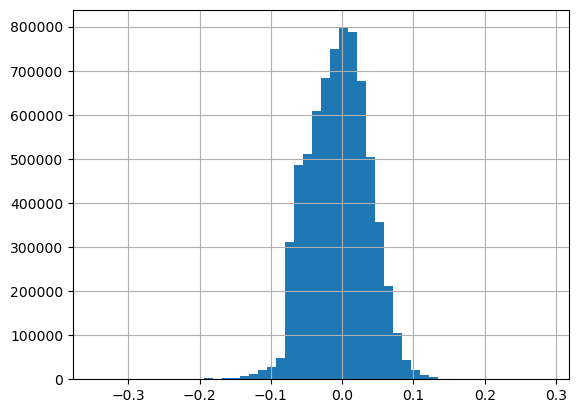

In [36]:
# quick histogram 

texts['Partisan_Score'].hist(bins = 50)

### **Add a sure Ideology: Higher Threshold**

In [37]:
texts['sure_ideology'] = texts['Partisan_Score'].apply(
    lambda x: "left" if x < -0.03 else ("right" if x > 0.03 else "None")
)

texts["sure_leaning"] = texts["sure_ideology"].apply(lambda x: "r" if x == "right" else "l" if x == "left" else "indif")

texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score,ideology,emi,sure_ideology,sure_leaning
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E,None,indif
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E,None,indif
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I,right,r
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E,right,r
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I,None,indif
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I,None,indif
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I,left,l
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I,None,indif
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I,None,indif


### **Distribution**

In [138]:
texts['ideology'].value_counts().to_frame('Count').join(texts['ideology'].value_counts(normalize=True).to_frame('%')).reset_index()

,ideology,Count,%
0,left,3757281,0.535931
1,right,3253478,0.464069


In [139]:
texts['sure_ideology'].value_counts().to_frame('Count').join(texts['sure_ideology'].value_counts(normalize=True).to_frame('%')).reset_index()

,sure_ideology,Count,%
0,None,3541540,0.505158
1,left,2034185,0.290152
2,right,1435034,0.204690


In [140]:
texts['emi'].value_counts().to_frame('Count').join(texts['emi'].value_counts(normalize=True).to_frame('%')).reset_index()

,emi,Count,%
0,I,3635375,0.518542
1,E,3375384,0.481458


### **Share of E and I speaking per text type**

In [39]:
texts["E_speaking"] = texts["finetuned_len_EMI_z_trans"].apply(lambda x: 1 if x >= 0 else 0)
texts

texts_summary = (
    texts
    .groupby('type')
    .agg(E_share=('E_speaking', 'mean'),
         count=('E_speaking', 'count'))
    .reset_index()
)

total_interactions = texts.shape[0]
texts_summary['interaction_share'] = texts_summary['count'] / total_interactions
texts_summary = texts_summary.sort_values('E_share', ascending=False)


texts_summary['I_share'] = 1 - texts_summary["E_share"]
texts_summary

,type,E_share,count,interaction_share,I_share
0,child,0.484927,4936035,0.704066,0.515073
1,parent,0.480651,1975873,0.281834,0.519349
2,submission,0.324327,98851,0.014100,0.675673


### **Share ofright and left leaning per text type**

In [142]:
texts["right_leaning"] = texts["ideology"].apply(lambda x: 1 if x == "right" else 0)

texts_ideology_summary = (
    texts
    .groupby('type')
    .agg(right_share=('right_leaning', 'mean'),
         count=('right_leaning', 'count'))
    .reset_index()
)

total_interactions = texts.shape[0]
texts_ideology_summary['interaction_share'] = texts_ideology_summary['count'] / total_interactions
texts_ideology_summary = texts_ideology_summary.sort_values('right_share', ascending=False)


texts_ideology_summary['left_share'] = 1 - texts_ideology_summary["right_share"]
texts_ideology_summary

,type,right_share,count,interaction_share,left_share
2,submission,0.558780,98851,0.014100,0.441220
1,parent,0.471773,1975873,0.281834,0.528227
0,child,0.459089,4936035,0.704066,0.540911


In [143]:

texts

,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,predictions_prob_disagree,type,Partisan_Score,ideology,emi,sure_ideology,E_speaking,right_leaning,sure_leaning
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E,None,1,1,indif
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E,None,1,1,indif
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I,right,0,1,r
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E,right,1,1,r
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I,None,0,1,indif
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I,None,0,0,indif
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I,left,0,0,l
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I,None,0,0,indif
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I,None,0,0,indif


### **By sure Ideology**

In [144]:
counts = (
    texts
    .groupby(['type', 'sure_leaning'])
    .size()
    .reset_index(name='count')
)
counts

total_by_type = (
    texts
    .groupby('type')
    .size()
    .reset_index(name='total')
)

total_by_type

,type,total
0,child,4936035
1,parent,1975873
2,submission,98851


In [145]:
texts_ideology_summary_sure = counts.merge(total_by_type, on='type')
texts_ideology_summary_sure['share'] = (
    texts_ideology_summary_sure['count'] / texts_ideology_summary_sure['total']
)

# Optional: Sort for readability
texts_ideology_summary_sure = texts_ideology_summary_sure.sort_values(
    ['type', 'sure_leaning']
)
texts_ideology_summary_sure

,type,sure_leaning,count,total,share
0,child,indif,2526928,4936035,0.511935
1,child,l,1432513,4936035,0.290215
2,child,r,976594,4936035,0.197850
3,parent,indif,961428,1975873,0.486584
4,parent,l,581058,1975873,0.294077
5,parent,r,433387,1975873,0.219340
6,submission,indif,53184,98851,0.538022
7,submission,l,20614,98851,0.208536
8,submission,r,25053,98851,0.253442


In [146]:
summary_pivot = texts_ideology_summary_sure.pivot(
    index='type', columns='sure_leaning', values='share'
).fillna(0)
summary_pivot

sure_leaning,indif,l,r
type,,,
child,0.511935,0.290215,0.197850
parent,0.486584,0.294077,0.219340
submission,0.538022,0.208536,0.253442


## **2.2) EMI and Ideology**

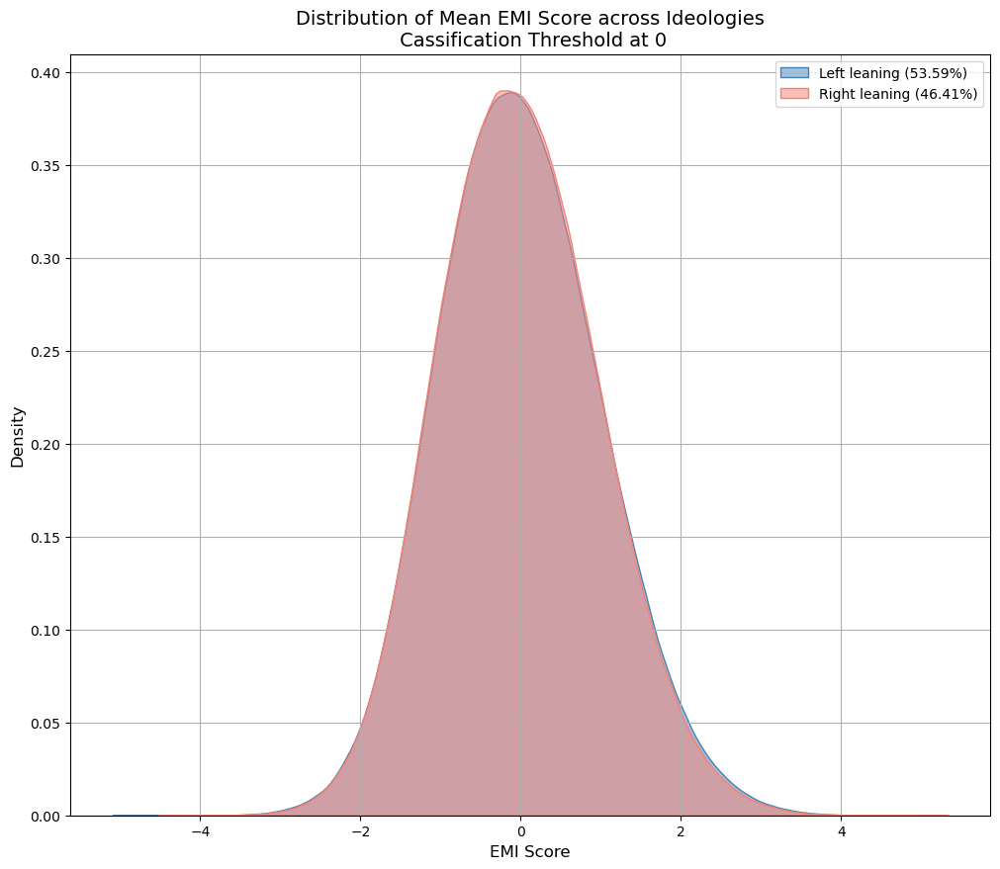

In [74]:
fig = plt.subplots(figsize=(12, 10))

share_right = len(texts[texts['ideology'] == "right"]) / len(texts) * 100
share_left = len(texts[texts['ideology'] == "left"]) / len(texts) * 100



sns.kdeplot(data=texts[texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"],  label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"],  label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)


plt.xlabel("EMI Score", fontsize = 12)
plt.ylabel("Density", fontsize = 12)
plt.legend()
plt.grid(True)
plt.title("Distribution of Mean EMI Score across Ideologies\n Cassification Threshold at 0", fontsize = 14)

plt.savefig("plots/Distribution_EMI_by_Ideology.pdf")

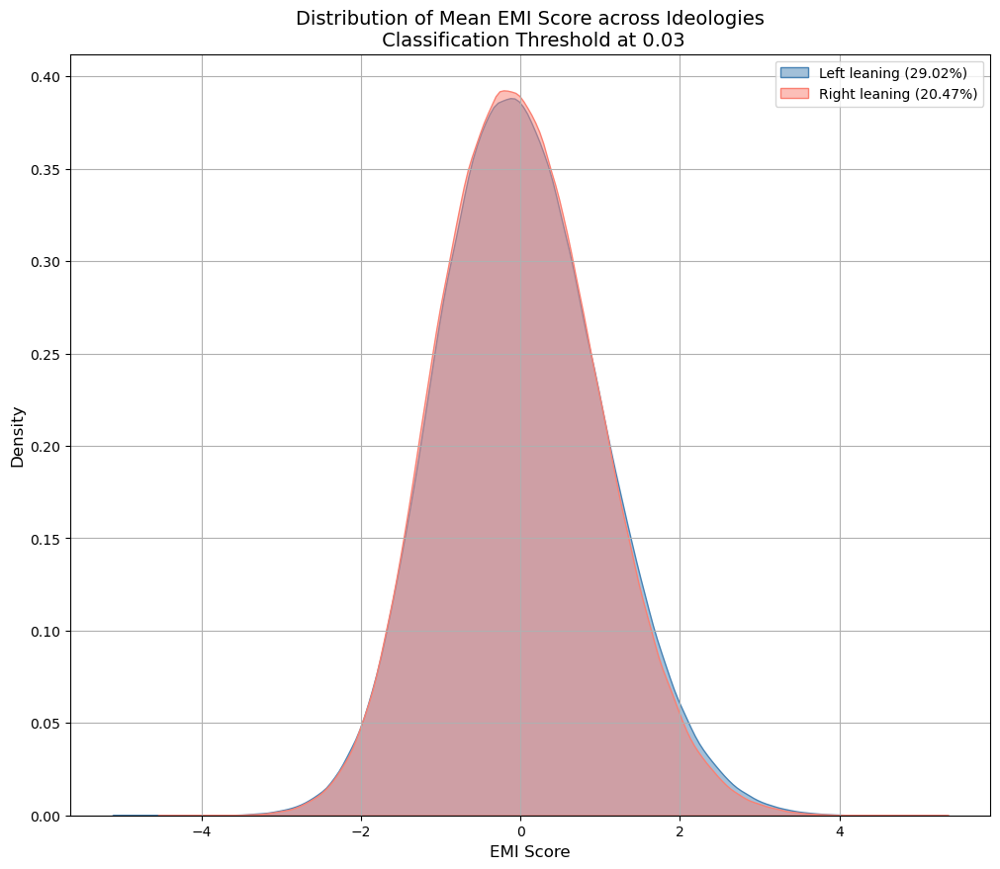

In [73]:
fig = plt.subplots(figsize=(12, 10))

share_right = len(texts[texts['sure_ideology'] == "right"]) / len(texts) * 100
share_left = len(texts[texts['sure_ideology'] == "left"]) / len(texts) * 100



sns.kdeplot(data=texts[texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"],  label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"],  label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)


plt.xlabel("EMI Score", fontsize = 12)
plt.ylabel("Density", fontsize = 12)
plt.legend()
plt.grid(True)
plt.title("Distribution of Mean EMI Score across Ideologies\n Classification Threshold at 0.03", fontsize = 14)

plt.savefig("plots/Distribution_EMI_by_Ideology_sure.pdf")

/tmp/ipykernel_551/3949189446.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_right = len(texts[texts['type'] == "submission"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/3949189446.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_left = len(texts[texts['type'] == "submission"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/3949189446.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submission"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
/tmp/ipykernel_551/3949189446.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submission"][texts['

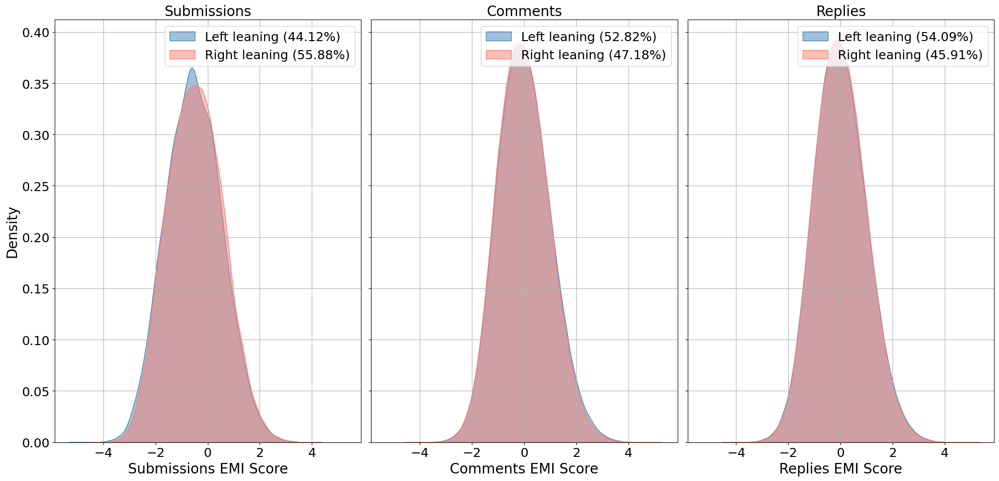

In [151]:

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)

share_right = len(texts[texts['type'] == "submission"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
share_left = len(texts[texts['type'] == "submission"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100

sns.kdeplot(data=texts[texts['type'] == "submission"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "submission"][texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)

axes[0].set_xlabel("Submissions EMI Score", fontsize = 20)
axes[0].set_ylabel("Density", fontsize = 20)
axes[0].legend(fontsize = 18, loc = "upper right")
axes[0].set_title(f"Submissions", fontsize = 20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


share_right = len(texts[texts['type'] == "parent"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "parent"]) * 100
share_left = len(texts[texts['type'] == "parent"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "parent"]) * 100

sns.kdeplot(data=texts[texts['type'] == "parent"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "parent"][texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[1].set_xlabel("Comments EMI Score", fontsize = 20)
axes[1].set_ylabel("Density", fontsize = 20)
axes[1].legend(fontsize = 18, loc = "upper right")
axes[1].set_title(f"Comments", fontsize = 20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

share_right = len(texts[texts['type'] == "child"][texts['ideology'] == "right"]) / len(texts[texts['type'] == "child"]) * 100
share_left = len(texts[texts['type'] == "child"][texts['ideology'] == "left"]) / len(texts[texts['type'] == "child"]) * 100

sns.kdeplot(data=texts[texts['type'] == "child"][texts['ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "child"][texts['ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[2].set_xlabel("Replies EMI Score", fontsize = 20)
axes[2].set_ylabel("Density", fontsize = 20)
axes[2].legend(fontsize = 18, loc = "upper right")
axes[2].set_title(f"Replies", fontsize = 20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Distribution_EMI_Ideology_Texttype.pdf", bbox_inches='tight')


/tmp/ipykernel_551/1953797336.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_right = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/1953797336.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  share_left = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100
/tmp/ipykernel_551/1953797336.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
/tmp/ipykernel_551/1953797336.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.kdeplot(data=texts[texts['type'] == "submi

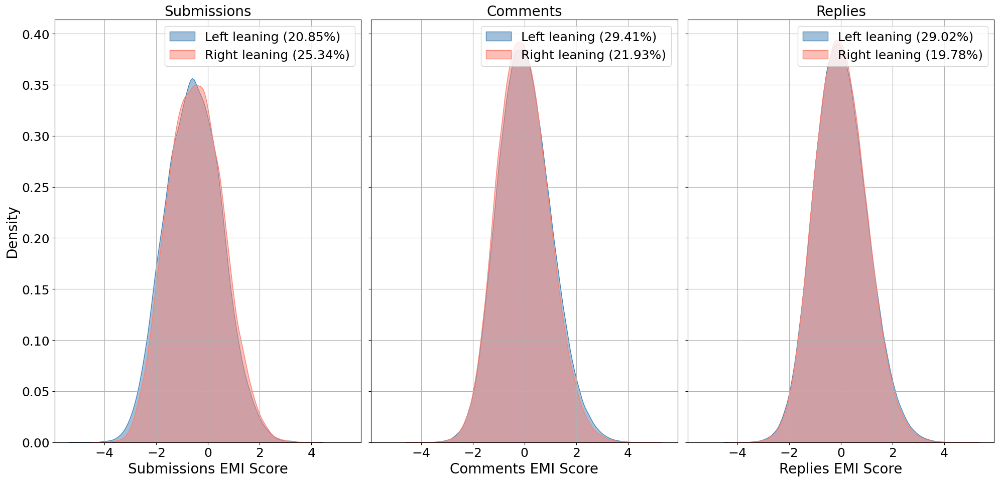

In [152]:

fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)

share_right = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "submission"]) * 100
share_left = len(texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "submission"]) * 100

sns.kdeplot(data=texts[texts['type'] == "submission"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "submission"][texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[0], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[0].set_xlabel("Submissions EMI Score", fontsize = 20)
axes[0].set_ylabel("Density", fontsize = 20)
axes[0].legend(fontsize = 18, loc = "upper right")
axes[0].set_title(f"Submissions", fontsize = 20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


share_right = len(texts[texts['type'] == "parent"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "parent"]) * 100
share_left = len(texts[texts['type'] == "parent"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "parent"]) * 100

sns.kdeplot(data=texts[texts['type'] == "parent"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "parent"][texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[1], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[1].set_xlabel("Comments EMI Score", fontsize = 20)
axes[1].set_ylabel("Density", fontsize = 20)
axes[1].legend(fontsize = 18, loc = "upper right")
axes[1].set_title(f"Comments", fontsize = 20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

share_right = len(texts[texts['type'] == "child"][texts['sure_ideology'] == "right"]) / len(texts[texts['type'] == "child"]) * 100
share_left = len(texts[texts['type'] == "child"][texts['sure_ideology'] == "left"]) / len(texts[texts['type'] == "child"]) * 100

sns.kdeplot(data=texts[texts['type'] == "child"][texts['sure_ideology'] == "left"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Left leaning ({share_left:.2f}%)', color='steelblue', fill=True, alpha=0.5)
sns.kdeplot(data=texts[texts['type'] == "child"][texts['sure_ideology'] == "right"][f"finetuned_len_EMI_z_trans"], ax = axes[2], label=f'Right leaning ({share_right:.2f}%)', color='salmon', fill=True, alpha=0.5)
axes[2].set_xlabel("Replies EMI Score", fontsize = 20)
axes[2].set_ylabel("Density", fontsize = 20)
axes[2].legend(fontsize = 18, loc = "upper right")
axes[2].set_title(f"Replies", fontsize = 20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Distribution_EMI_sure_Ideology_Texttype.pdf", bbox_inches='tight')


### **Correlation Analysis**

In [40]:
texts[["finetuned_len_EMI_z_trans", "Partisan_Score"]].corr()

,finetuned_len_EMI_z_trans,Partisan_Score
finetuned_len_EMI_z_trans,1.00000,-0.00499
Partisan_Score,-0.00499,1.00000


In [41]:
# get correlation and CIs

def get_r_p_CI(df, x_col, y_col):
    # Clean data
    x = df[x_col]
    y = df[y_col]
    
    mask = (~np.isnan(x)) & (~np.isnan(y)) & (~np.isinf(x)) & (~np.isinf(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Compute Pearson r and p
    r, p = pearsonr(x_clean, y_clean)
    
    # Compute 95% CI using Fisher z-transformation
    n = len(x_clean)
    z = np.arctanh(r) 
    se = 1 / np.sqrt(n - 3)
    z_crit = norm.ppf(0.975)  
    
    ci_low_z = z - z_crit * se
    ci_high_z = z + z_crit * se
    ci_low = np.tanh(ci_low_z)  
    ci_high = np.tanh(ci_high_z)
    

    df = n - 2
    p_str = "p < .001" if p < 0.001 else f"p = {p:.3f}"
    
    print(f"r({df}) = {r:.2f}, 95% CI [{ci_low:.2f}, {ci_high:.2f}], {p_str}")

print("Correlation of Texts EMI score and Partisan Score")
get_r_p_CI(texts, "finetuned_len_EMI_z_trans", "Partisan_Score")


Correlation of Texts EMI score and Partisan Score
r(7010757) = -0.00, 95% CI [-0.01, -0.00], p < .001


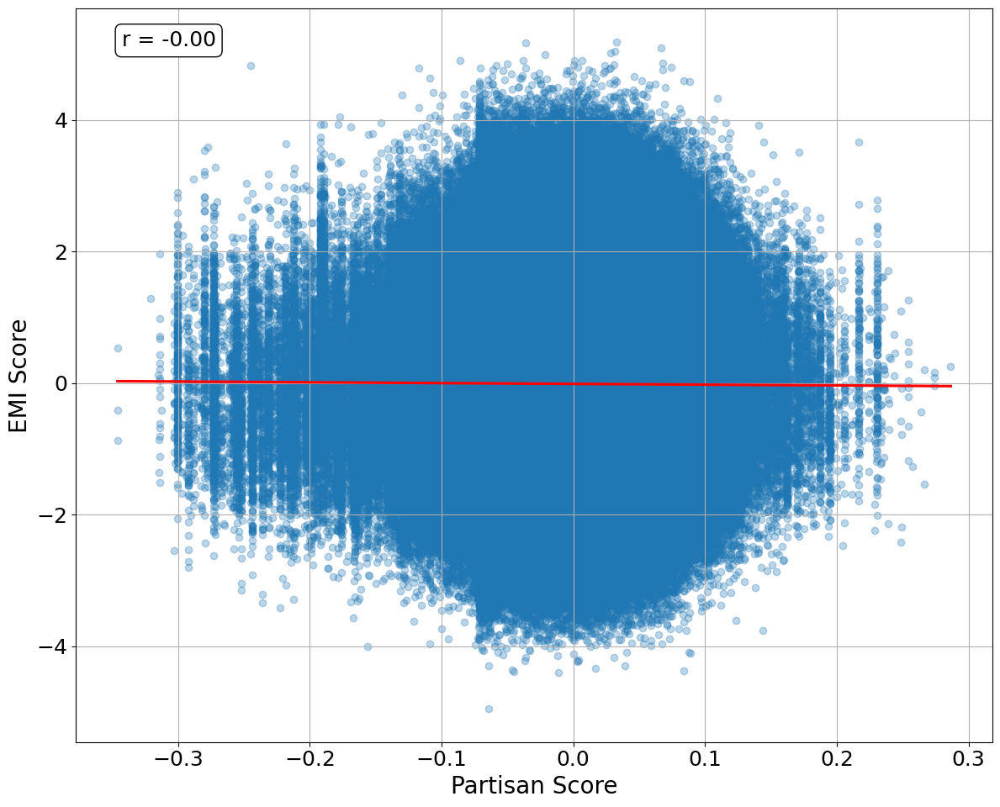

In [154]:
fig = plt.subplots(figsize=(12, 10))
sns.regplot(data=texts, x = "Partisan_Score", y = "finetuned_len_EMI_z_trans", scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'})

plt.xlabel("Partisan Score", fontsize = 20)
plt.ylabel("EMI Score", fontsize = 20)
plt.grid(True)
#plt.title("Scatterplot of Partisan Score vs. EMI Score", fontsize = 14)

plt.tick_params(axis='both', labelsize=18)


#valid_data = all_parent_disagreement_stats[["EMI_score", "share_disagree"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(texts["finetuned_len_EMI_z_trans"], texts["Partisan_Score"])
plt.annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
            bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

plt.tight_layout(rect=[0, 0, 1, 0.97])

plt.savefig("plots/Partisan_EMI_Scatter.png", dpi = 300, bbox_inches='tight')


**Interpretation:**

* no correlation of EMI Score and author Ideology of a text

### **Differences in mean EMI scores between Ideologies?**

In [79]:
texts.groupby("ideology")[["finetuned_len_EMI_z_trans", "finetuned_len_norm_z_trans_EMI",
                           "self_len_EMI_z_trans", "self_len_norm_z_trans_EMI"]].mean().reset_index()


,ideology,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI
0,left,-0.005011,-0.005827,-0.003358,-0.004888
1,right,-0.014234,-0.011217,-0.019035,-0.017719


In [132]:
texts.groupby("sure_ideology")[["finetuned_len_EMI_z_trans", "finetuned_len_norm_z_trans_EMI",
                                "self_len_EMI_z_trans", "self_len_norm_z_trans_EMI"]].mean().reset_index()


,sure_ideology,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI
0,None,-0.005413,-0.005192,-0.007497,-0.008548
1,left,-0.003735,-0.005547,-0.000818,-0.002437
2,right,-0.026737,-0.020011,-0.032288,-0.028418


In [80]:

def make_t_test(EMI_method):
    group1 = texts[texts["ideology"] == "right"][EMI_method].dropna()
    group2 = texts[texts["ideology"] == "left"][EMI_method].dropna()

    # Standard t-test (equal variance assumed)
    #t_stat, p_value = ttest_ind(group1, group2)
    
    # Welch's t-test (no equal variance assumption)
    t_stat, p_value = ttest_ind(group1, group2, equal_var=False)

    # Determine significance level
    if p_value < 0.001:
        sig = "***"
    elif p_value < 0.01:
        sig = "**"
    elif p_value < 0.05:
        sig = "*"
    else:
        sig = "ns"  # not significant

    return f"{EMI_method}: t = {t_stat:.3f}, p = {p_value:.4f} ({sig})"



methods = ["finetuned_len_EMI_z_trans", "finetuned_len_norm_z_trans_EMI",
           "self_len_EMI_z_trans", "self_len_norm_z_trans_EMI"]

for method in methods:
    print(make_t_test(method))


finetuned_len_EMI_z_trans: t = -12.143, p = 0.0000 (***)
finetuned_len_norm_z_trans_EMI: t = -9.710, p = 0.0000 (***)
self_len_EMI_z_trans: t = -20.794, p = 0.0000 (***)
self_len_norm_z_trans_EMI: t = -19.388, p = 0.0000 (***)


**Interpretation:**

* difference in mean EMI between right and left is significant (across all models)
* right: mean EMI is negative (intuition based)
* left: mean EMI is positive

$\to$ BUT super low scale, still: significant

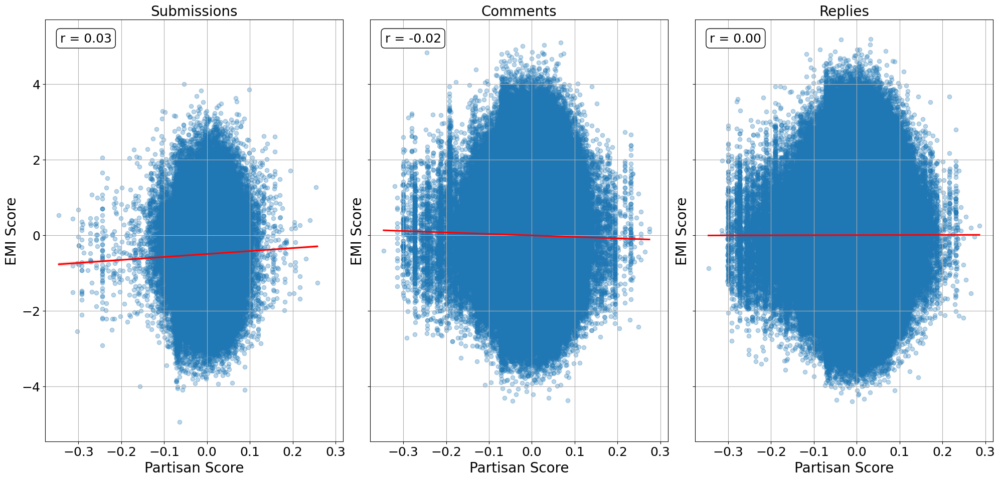

In [153]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of EMI Score and Ideology", fontsize=16)

# --- Submissions ---
sns.regplot(
    data=texts[texts['type'] == 'submission'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'submission'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_ylabel("EMI Score", fontsize=20)
axes[0].set_xlabel("Partisan Score", fontsize=20)
#axes[0].legend()
axes[0].set_title(f"Submissions", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)

# --- Comments ---
sns.regplot(
    data=texts[texts['type'] == 'parent'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'parent'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_ylabel("EMI Score", fontsize=20)
axes[1].set_xlabel("Partisan Score", fontsize=20)
#axes[1].legend()
axes[1].set_title(f"Comments", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)

# --- Replies ---
sns.regplot(
    data=texts[texts['type'] == 'child'],
    y="finetuned_len_EMI_z_trans", x="Partisan_Score", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'child'][["finetuned_len_EMI_z_trans", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["Partisan_Score"], valid_data["finetuned_len_EMI_z_trans"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_ylabel("EMI Score", fontsize=20)
axes[2].set_xlabel("Partisan Score", fontsize=20)
#axes[2].legend()
axes[2].set_title(f"Replies", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)


plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_EMI_Ideology.png", dpi = 300, bbox_inches='tight')

plt.show()

**Interpretation**

* Among Submissions, right leaning users tend to speak more evidence based
* Among Comments, right leaning users tend to speak more intuition based
* Among Replies, there is no relation


### **Correlation Coefficients and CIs**

In [160]:
# get correlation and CIs

def get_r_p_CI(df, x_col, y_col):
    # Clean data
    x = df[x_col]
    y = df[y_col]
    
    mask = (~np.isnan(x)) & (~np.isnan(y)) & (~np.isinf(x)) & (~np.isinf(y))
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Compute Pearson r and p
    r, p = pearsonr(x_clean, y_clean)
    
    # Compute 95% CI using Fisher z-transformation
    n = len(x_clean)
    z = np.arctanh(r)  # Fisher transformation
    se = 1 / np.sqrt(n - 3)
    z_crit = norm.ppf(0.975)  # 95% CI
    
    ci_low_z = z - z_crit * se
    ci_high_z = z + z_crit * se
    ci_low = np.tanh(ci_low_z)  
    ci_high = np.tanh(ci_high_z)
    
    # Format (APA style)
    df = n - 2
    p_str = "p < .001" if p < 0.001 else f"p = {p:.3f}"
    
    print(f"r({df}) = {r:.2f}, 95% CI [{ci_low:.2f}, {ci_high:.2f}], {p_str}")

get_r_p_CI(texts[texts["type"] == "submission"], "finetuned_len_EMI_z_trans", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "parent"], "finetuned_len_EMI_z_trans", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "child"], "finetuned_len_EMI_z_trans", "Partisan_Score")


r(98849) = 0.03, 95% CI [0.03, 0.04], p < .001
r(1975871) = -0.02, 95% CI [-0.02, -0.02], p < .001
r(4936033) = 0.00, 95% CI [0.00, 0.00], p = 0.015


***
# **3) Ideology and Stance**
***

In [43]:
# for submissions and parents, we need to get the share of disagree, they are part of
# merge with all_submission_disagreement_stats and all_parent_disagreement_stats

texts = texts.merge(all_submission_disagreement_stats[["submission_id", "share_disagree"]], left_on = "id", right_on = "submission_id", 
            how = "left").rename(columns = {"share_disagree" : "sub_share_disagree"})

texts = texts.merge(all_parent_disagreement_stats[["msg_id_parent", "share_disagree"]], left_on = "id", right_on = "msg_id_parent", 
            how = "left").rename(columns = {"share_disagree" : "parent_share_disagree"})

texts


,id,author,finetuned_len_EMI_z_trans,finetuned_len_norm_z_trans_EMI,self_len_EMI_z_trans,self_len_norm_z_trans_EMI,predictions_score_ft,predictions_ft,prob_disagree,type,Partisan_Score,ideology,emi,sure_ideology,sure_leaning,E_speaking,submission_id,sub_share_disagree,msg_id_parent,parent_share_disagree
0,c7ecp8d,ramblin_dash,0.476542,0.514532,0.711538,0.624110,0.6180,no_disagreement,0.38180,parent,0.017145,right,E,None,indif,1,NaN,NaN,c7ecp8d,0.0
1,c7efx8q,senatorskeletor,0.269695,0.269966,0.150568,0.130100,0.9507,disagree,0.95070,parent,0.013507,right,E,None,indif,1,NaN,NaN,c7efx8q,0.5
2,c7edr13,tehnoff,-1.058486,-0.620579,-1.365538,-1.228132,0.8633,no_disagreement,0.13650,parent,0.035521,right,I,right,r,0,NaN,NaN,c7edr13,0.0
3,c7ee45j,ibiteyou,0.249878,0.296310,0.241266,0.203621,0.9126,no_disagreement,0.08750,parent,0.182155,right,E,right,r,1,NaN,NaN,c7ee45j,0.0
4,c7ejopx,dublinben,-0.921904,-0.907752,-0.704820,-0.632541,0.9395,no_disagreement,0.06036,parent,0.024481,right,I,None,indif,0,NaN,NaN,c7ejopx,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7010754,18letrx,optimalg,-0.510420,-0.555166,-0.326702,-0.625037,0.7837,no_disagreement,0.21620,submission,-0.024883,left,I,None,indif,0,18letrx,0.000000,NaN,NaN
7010755,18m5lyo,19thnews,-0.002839,-0.084226,0.094693,-0.176572,0.9240,no_disagreement,0.07610,submission,-0.082393,left,I,left,l,0,18m5lyo,0.000000,NaN,NaN
7010756,18p9iet,optimalg,-0.633410,-0.580210,-0.732976,-0.857240,0.6665,disagree,0.66650,submission,-0.024883,left,I,None,indif,0,18p9iet,0.076923,NaN,NaN
7010757,18qmiau,optimalg,-0.548816,-0.584471,-0.369686,-0.645052,0.7540,no_disagreement,0.24610,submission,-0.024883,left,I,None,indif,0,18qmiau,0.000000,NaN,NaN


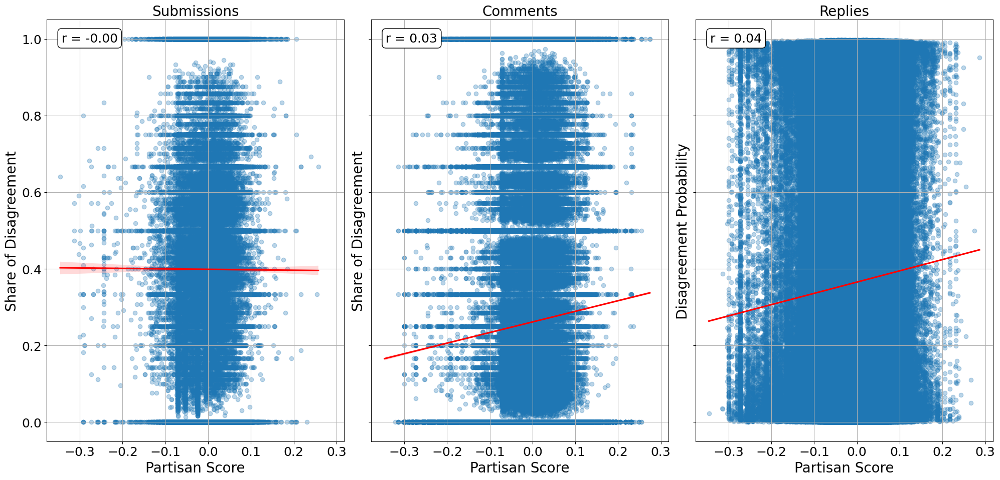

In [156]:
# plot
fig, axes = plt.subplots(1, 3, figsize=(20, 10), sharex=True, sharey=True)
#fig.suptitle("Relation of Disagreement Probability Score and Ideology", fontsize=16)

# --- Submissions ---
sns.regplot(
    data=texts[texts['type'] == 'submission'],
    y="sub_share_disagree", x="Partisan_Score", ax=axes[0],
    #label=f'Disagree ({human_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'submission'][["prob_disagree", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["prob_disagree"], valid_data["Partisan_Score"])
axes[0].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[0].set_ylabel("Share of Disagreement", fontsize=20)
axes[0].set_xlabel("Partisan Score", fontsize=20)
#axes[0].legend()
axes[0].set_title(f"Submissions", fontsize=20)
axes[0].grid(True)
axes[0].tick_params(axis='both', labelsize=18)


# --- Comments ---
sns.regplot(
    data=texts[texts['type'] == 'parent'],
    y="parent_share_disagree", x="Partisan_Score", ax=axes[1],
    #label=f'Disagree ({mod_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'parent'][["prob_disagree", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["prob_disagree"], valid_data["Partisan_Score"])
axes[1].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[1].set_ylabel("Share of Disagreement", fontsize=20)
axes[1].set_xlabel("Partisan Score", fontsize=20)
#axes[1].legend()
axes[1].set_title(f"Comments", fontsize=20)
axes[1].grid(True)
axes[1].tick_params(axis='both', labelsize=18)


# --- Replies ---
sns.regplot(
    data=texts[texts['type'] == 'child'],
    y="prob_disagree", x="Partisan_Score", ax=axes[2],
    #label=f'Disagree ({all_share_disagree*100:.1f}%)',
    scatter_kws={'alpha': 0.3}, line_kws={'color': 'red'}
)
valid_data = texts[texts['type'] == 'child'][["prob_disagree", "Partisan_Score"]].replace([np.inf, -np.inf], np.nan).dropna()
r, _ = pearsonr(valid_data["prob_disagree"], valid_data["Partisan_Score"])
axes[2].annotate(f"r = {r:.2f}", xy=(0.05, 0.97), xycoords='axes fraction', fontsize=18, ha='left', va='top',
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
axes[2].set_ylabel("Disagreement Probability", fontsize=20)
axes[2].set_xlabel("Partisan Score", fontsize=20)
#axes[2].legend()
axes[2].set_title(f"Replies", fontsize=20)
axes[2].grid(True)
axes[2].tick_params(axis='both', labelsize=18)


plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("plots/Scatter_Disagree_Ideology.png", dpi = 300, bbox_inches='tight')

plt.show()

In [161]:
# get correlation and CIs

get_r_p_CI(texts[texts["type"] == "submission"], "prob_disagree", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "parent"], "prob_disagree", "Partisan_Score")
get_r_p_CI(texts[texts["type"] == "child"], "prob_disagree", "Partisan_Score")


r(98849) = -0.00, 95% CI [-0.01, 0.00], p = 0.340
r(1975871) = 0.03, 95% CI [0.03, 0.03], p < .001
r(4936033) = 0.04, 95% CI [0.03, 0.04], p < .001


**CAUTION**

* Ideology is user bind, stance is text bind $\to$ can be distorted

In [95]:
author_texts = texts.groupby("author").agg(
    mean_disagree_prob = ('prob_disagree', 'mean'),
    mean_EMI = ('finetuned_len_EMI_z_trans', 'mean'),
    ideology = ("Partisan_Score", 'first')
).reset_index()

author_texts[['mean_disagree_prob',	'mean_EMI', 'ideology']].corr()

,mean_disagree_prob,mean_EMI,ideology
mean_disagree_prob,1.000000,-0.098566,0.018373
mean_EMI,-0.098566,1.000000,0.000599
ideology,0.018373,0.000599,1.000000
